# Customer Churn Analysis and Prediction

* CustomerID -- Benzersiz müşteri kimliği
* Churn -- Churn Bayrağı (Müşterinin ayrılma durumunu belirten bayrak)
* Tenure -- Müşterinin organizasyondaki süresi
* PreferredLoginDevice -- Müşterinin tercih ettiği giriş cihazı
* CityTier -- Şehir seviyesi
* WarehouseToHome -- Müşterinin evi ile depo arasındaki mesafe
* PreferredPaymentMode -- Müşterinin tercih ettiği ödeme yöntemi
* Gender -- Müşterinin cinsiyeti
* HourSpendOnApp -- Mobil uygulama veya web sitesinde geçirilen saat sayısı
* NumberOfDeviceRegistered -- Müşteri tarafından kaydedilen toplam cihaz sayısı
* PreferedOrderCat -- Son bir ayda müşterinin tercih ettiği sipariş kategorisi
* SatisfactionScore -- Müşterinin hizmet üzerindeki memnuniyet skoru
* MaritalStatus -- Müşterinin medeni durumu
* NumberOfAddress -- Müşteriye eklenen toplam adres sayısı
* Complain -- Son bir ayda herhangi bir şikayetin olup olmadığı
* OrderAmountHikeFromlastYear -- Geçen yıla göre sipariş tutarındaki yüzde artış
* CouponUsed -- Son bir ayda kullanılan toplam kupon sayısı
* OrderCount -- Son bir ayda yapılan toplam sipariş sayısı
* DaySinceLastOrder -- Müşterinin son siparişinden itibaren geçen gün sayısı
* CashbackAmount -- Son bir ayda ortalama nakit geri ödeme miktarı


In [205]:
#Churn , bir şirketin müşterilerinin ne kadarının ürünlerden veya hizmetlerden vazgeçtiğini ifade eder.
#Churn analizini şirketler müşterilerle aralarındaki ilişkiyi güçlendirmek ,memnuniyeti arttırmak ve gelirlerini yüksekte tutmak için kullanırlar.
#Aynı zamanda yeni bir müşteri bulmak olan müşteririyi korumaktan daha maliyetlidir.

In [206]:
# Model
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn import svm
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

# Değerlendirme
from sklearn import metrics
from sklearn.metrics import silhouette_samples,silhouette_score,roc_auc_score,roc_curve,confusion_matrix,classification_report
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, jaccard_score, log_loss


# Kümeleme
from scipy.cluster.hierarchy import linkage,fcluster
from sklearn.cluster import KMeans 

# Veri İşleme
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
%matplotlib inline

### Paket Sürümleri
* python : 3.11.4 
* sklearn : 0.12.2
* xgboost : 1.7.4
* pandas : 2.0.3
* numpy : 1.24.4
* seaborn : 0.12.2
* matplotlib : 3.7.2
  

In [207]:
data = pd.read_csv('data.csv')    # data.csv dosyamızda bulunan verilermizi aynı isimle içeri aktardık. 

In [208]:
df = pd.DataFrame(data)           # Aldığımız verilerden 'df' adında bir DataFrame oluşturalım.Bir süre 'df' üzerinde işlem yapıcaz.Orjinal verimiz data'da dursun.
df1 = df.copy()                    # Orjinal veriyi bozmamak için kopya alıyoruz. 

In [209]:
df.head()                       #İlk 5 satıra bakalım ve veri setimizde neler olduğuna hızlı bir göz atalım.

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,160
1,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,121
2,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120
3,50004,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134
4,50005,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,130


## Veri Setini İnceleyelim ve Anlayalım

### Exploratory Data Analysis (EDA) - Keşifçi Veri Analizi  
- Veri setiyle ilgili temel bilgileri elde edip hakkında anlamlı çıkarımlar yapabilmek için bazı analizler ve görselleştirmeler yapacağız.
- EDA kısmında veri setinin yapısını,özelliklerini,eksik ve aykırı değerleri,ilişkileri,dağılımları ve bazı istatiksel özellikleri inceleyip,keşfedeceğiz.
- Veri setindeki korelasyonları,eğilimleri ve desenleri(pattern) belirlemek ,önemli özellikleri tanımlamak gibi işlerimizi EDA'nın içinde yapıcaz. 

In [210]:
df.shape    # Veri setimizin boyutuna bakalım. 
            # 20 özellik(sütun) 5630 satırlık bir verimiz var.

(5630, 20)

In [211]:
df.info()         # Verimin genel yapısına bir bakış.Değişkenleri,veri tiplerini ve eksik verilerin özellikler arasında dağılımını görmek  için
                  # Bazı eksik değerler dışında anormal bir durum gözükmüyor.Object veri tipinde olan özelliklerin kategorik özellikleri temsil ettiğini söyleyebiliriz.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5366 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5379 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5375 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

In [212]:
# Kategorik benzersiz değerlerini yani her kategorik değişkenin hangi değerlere sahip olduğunu ve her birinin tekrar sayısını bulalım.
# value_counts() benzersiz değerleri ve sayılarını bulur
# Benzersiz değerlerin dağılımını,hangi değerlerin yaygın olduğunu ve sınıf dengesizliklerini  aynı zamanda nadir değerleride görürüz.
# Sonuçlara baktığımızda bazı değerler arasında farklar var,anormal denilebilecek kadar dengesizlik veya fark gözükmüyor.
for feature in df[:-1]:
    if df[feature].dtypes == 'O':             # Veri tipi object olan sutunları kontrol et.
        print(f"{feature}'ın Eşşiz Değerleri ve Frekansları:' \n {df[feature].value_counts()} \n")


PreferredLoginDevice'ın Eşşiz Değerleri ve Frekansları:' 
 PreferredLoginDevice
Mobile Phone    2765
Computer        1634
Phone           1231
Name: count, dtype: int64 

PreferredPaymentMode'ın Eşşiz Değerleri ve Frekansları:' 
 PreferredPaymentMode
Debit Card          2314
Credit Card         1501
E wallet             614
UPI                  414
COD                  365
CC                   273
Cash on Delivery     149
Name: count, dtype: int64 

Gender'ın Eşşiz Değerleri ve Frekansları:' 
 Gender
Male      3384
Female    2246
Name: count, dtype: int64 

PreferedOrderCat'ın Eşşiz Değerleri ve Frekansları:' 
 PreferedOrderCat
Laptop & Accessory    2050
Mobile Phone          1271
Fashion                826
Mobile                 809
Grocery                410
Others                 264
Name: count, dtype: int64 

MaritalStatus'ın Eşşiz Değerleri ve Frekansları:' 
 MaritalStatus
Married     2986
Single      1796
Divorced     848
Name: count, dtype: int64 



In [213]:
# Aynı zamanda özelliklerin açıklamasından da bildiğimiz gibi
# Churn ,CityTier ve Complain özelliklerinin sayısal tipte olmasına rağmen Kategorik özellik olduğunu biliyoruz

print(df['CityTier'].value_counts())      
print(df['Churn'].value_counts())
print(df['Complain'].value_counts())

#Bu özellikleri object tipinde veriye dönüştürelim
df = df.astype({'CityTier' : 'O','Churn' : 'O','Complain' : 'O'})



CityTier
1    3666
3    1722
2     242
Name: count, dtype: int64
Churn
0    4682
1     948
Name: count, dtype: int64
Complain
0    4026
1    1604
Name: count, dtype: int64


In [214]:
# CustomerID sutununu veri setinden çıkartalım.Çünkü belirli bir kullanıcı için işlem yapmayacağız.Bu durumda gereksiz bir sütun oluyor.
df.drop(['CustomerID'],axis = 1,inplace = True)

# Kategorik ve Sayısal özelliklerin sütunlarımızın isimlerini bir dizide tutalım
sayisallar = [sutun for sutun in df.columns if df[sutun].dtype in ['int64', 'float64']]
kategorikler = [sutun for sutun in df.columns if df[sutun].dtype in ['object']]
print('Sayısal Özelliklerimiz : \n ' , sayisallar)
print('Kategorik Özelliklerimiz : \n ' , kategorikler )

Sayısal Özelliklerimiz : 
  ['Tenure', 'WarehouseToHome', 'HourSpendOnApp', 'NumberOfDeviceRegistered', 'SatisfactionScore', 'NumberOfAddress', 'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount']
Kategorik Özelliklerimiz : 
  ['Churn', 'PreferredLoginDevice', 'CityTier', 'PreferredPaymentMode', 'Gender', 'PreferedOrderCat', 'MaritalStatus', 'Complain']


In [215]:
# Yukarıda yaptığımız işlemi kontrol edelim.
df.dtypes

Churn                           object
Tenure                         float64
PreferredLoginDevice            object
CityTier                        object
WarehouseToHome                float64
PreferredPaymentMode            object
Gender                          object
HourSpendOnApp                 float64
NumberOfDeviceRegistered         int64
PreferedOrderCat                object
SatisfactionScore                int64
MaritalStatus                   object
NumberOfAddress                  int64
Complain                        object
OrderAmountHikeFromlastYear    float64
CouponUsed                     float64
OrderCount                     float64
DaySinceLastOrder              float64
CashbackAmount                   int64
dtype: object

### Eksik Değerlere Bakış

In [216]:
df.isnull().sum()    # Eksik verilerin kontrolü yapalım.Şuan için eksik verilemiz sorun yaratıcak gibi durmuyor.

Churn                            0
Tenure                         264
PreferredLoginDevice             0
CityTier                         0
WarehouseToHome                251
PreferredPaymentMode             0
Gender                           0
HourSpendOnApp                 255
NumberOfDeviceRegistered         0
PreferedOrderCat                 0
SatisfactionScore                0
MaritalStatus                    0
NumberOfAddress                  0
Complain                         0
OrderAmountHikeFromlastYear    265
CouponUsed                     256
OrderCount                     258
DaySinceLastOrder              307
CashbackAmount                   0
dtype: int64

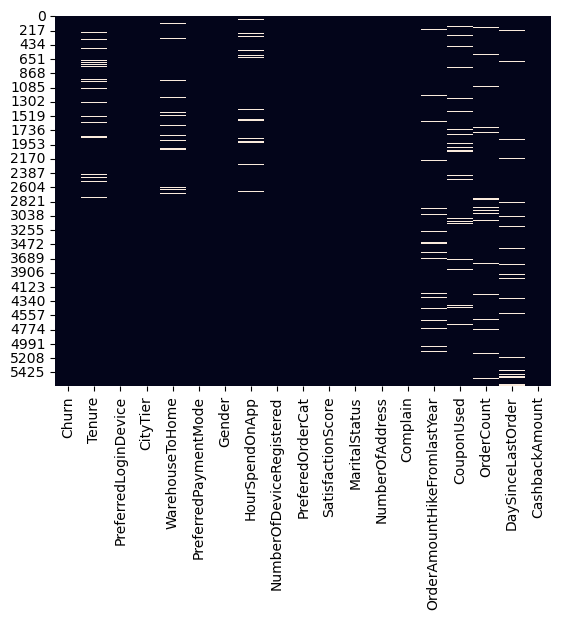

In [217]:
sns.heatmap(df.isnull(), cbar = False)   # Eksik değerlerin belli bir bölgeye veya sutuna yoğunlaşıp yoğunlaşmadığına bakalım.
plt.show()                               # Özelliklerin yarısında eksik değerler var ve hepsinde yaklaşık aynı sayıda eksik veri var.
                                         # Eksik verilerin hepsi sayısal değişkenlerde bu açıdan iyi aynı zamanda soru yaratıcak bir yoğunlaşma ve dağılımda bulunmuyor.

In [218]:
# Biraz daha ayrıntılı bilgi almak için ekrana yazdıralım
# Sonuca baktığımızda sutunların mean veya median değerleri ile eksik verileri doldurusak hızlı ve etkili bir sonuç alırız.
# Hepsi sayısal ve sutun basına yuzde 4 e yakın şekilde eksik veri olduğunu görüyorum.
for feature in df.columns:
    if df[feature].isnull().any():       # Herhangi bir eksik değerin olduğunu sutunu geçir
        print(feature.title(),'\n')
        print(f'{feature}\'da Bulunan Toplam Değerler : {len(df[feature])}')
        print(f'{feature}\'da Bulunan NaN Değerler : {df[feature].isnull().sum()}')
        print(f'{feature}\'da Bulunan Dolu Değerler : {df[feature].notnull().sum()}')
        print(f'{feature} \'ın Veri Tipi : {df[feature].dtypes}', '\n')


Tenure 

Tenure'da Bulunan Toplam Değerler : 5630
Tenure'da Bulunan NaN Değerler : 264
Tenure'da Bulunan Dolu Değerler : 5366
Tenure 'ın Veri Tipi : float64 

Warehousetohome 

WarehouseToHome'da Bulunan Toplam Değerler : 5630
WarehouseToHome'da Bulunan NaN Değerler : 251
WarehouseToHome'da Bulunan Dolu Değerler : 5379
WarehouseToHome 'ın Veri Tipi : float64 

Hourspendonapp 

HourSpendOnApp'da Bulunan Toplam Değerler : 5630
HourSpendOnApp'da Bulunan NaN Değerler : 255
HourSpendOnApp'da Bulunan Dolu Değerler : 5375
HourSpendOnApp 'ın Veri Tipi : float64 

Orderamounthikefromlastyear 

OrderAmountHikeFromlastYear'da Bulunan Toplam Değerler : 5630
OrderAmountHikeFromlastYear'da Bulunan NaN Değerler : 265
OrderAmountHikeFromlastYear'da Bulunan Dolu Değerler : 5365
OrderAmountHikeFromlastYear 'ın Veri Tipi : float64 

Couponused 

CouponUsed'da Bulunan Toplam Değerler : 5630
CouponUsed'da Bulunan NaN Değerler : 256
CouponUsed'da Bulunan Dolu Değerler : 5374
CouponUsed 'ın Veri Tipi : float

### Eksik Değerleri Temizleyelim

In [219]:
for feature in df[:-1]:
    if df[feature].isnull().any() == True and df[feature].dtypes == 'float64':
        df[feature].fillna(value = df[feature].median(), inplace = True)

In [220]:
df.isnull().sum()

Churn                          0
Tenure                         0
PreferredLoginDevice           0
CityTier                       0
WarehouseToHome                0
PreferredPaymentMode           0
Gender                         0
HourSpendOnApp                 0
NumberOfDeviceRegistered       0
PreferedOrderCat               0
SatisfactionScore              0
MaritalStatus                  0
NumberOfAddress                0
Complain                       0
OrderAmountHikeFromlastYear    0
CouponUsed                     0
OrderCount                     0
DaySinceLastOrder              0
CashbackAmount                 0
dtype: int64

### Aykırı Değer Kontrolü

In [221]:
# Aykırı değerleri görebilmek için boxplot ile görselleştirme yapıyoruz

def boxplot_maker(features):

        # 3x4'lük boxplot'larımızı koyacağız yeri hazırlayalım.Toplam 11 grafik çizicez
        fig,axes = plt.subplots(3, 4, figsize=(12, 9))

        # feature ile grafikdeki verimizi, i ile 
        for i, feature in enumerate(features):
            row = i // 4                  # Satır indeksi : Bölümde bölümün tam kısmını verir.Mesela i:5'teyken satır : 1 , 3'teyken satır : 0 da
            col = i % 4                   # Sütun indeksi : Bölümden kalanı verir.i:5'teyken sutun : 1 , 4'teyken sütun : 0
    
            ax = axes[row, col]  # İlgili hücreyi temsil etmesi için.Subplot
    
    
            sns.boxplot(data = df, y = feature, notch = True, showcaps = True, flierprops = {'marker': 'x'},
                            boxprops = {"facecolor" : (.4, .6, .8, .5)}, medianprops = {"color" : "coral"}, ax = ax)
    
            ax.set_title(feature)  # Hücreler için Başlık (Sütün isimleri)
            ax.set_ylabel('')      # Y ekseni etiketini temizleriz.Daha sağlıklı bir görüntü için
            ax.set_xlabel('')      # Aynı şekilde X'i de
    
        plt.tight_layout()         # Grafiklerin hücrelere düzgün şekilde sığması için
        plt.show()



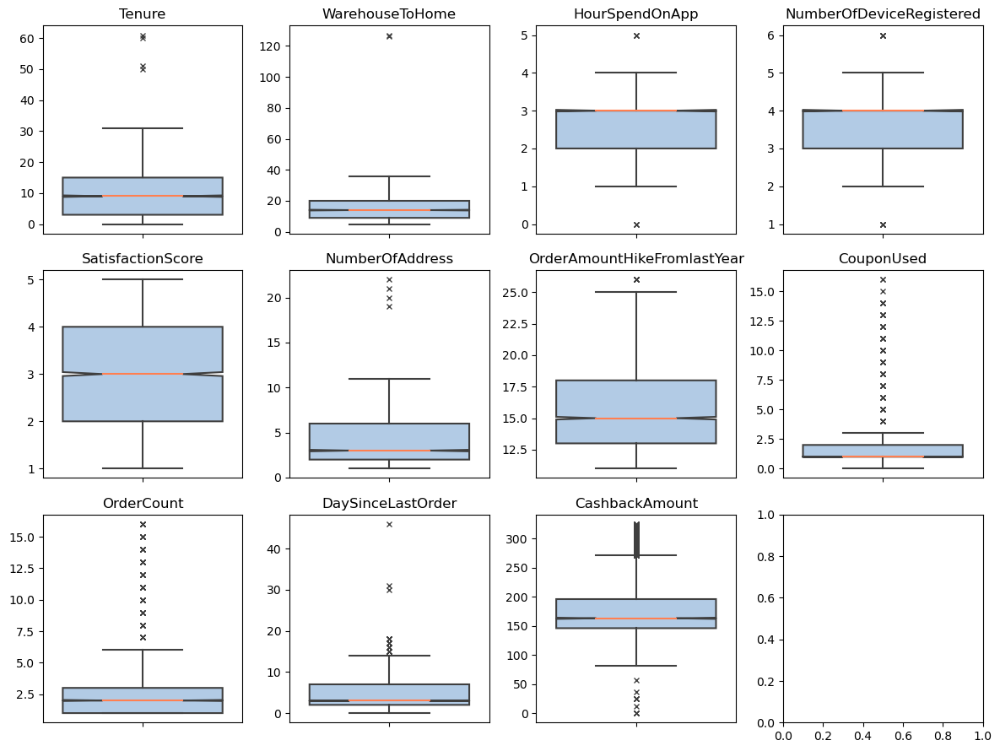

In [222]:
boxplot_maker(sayisallar)

In [223]:
## OutlierFinder Ekle buraya

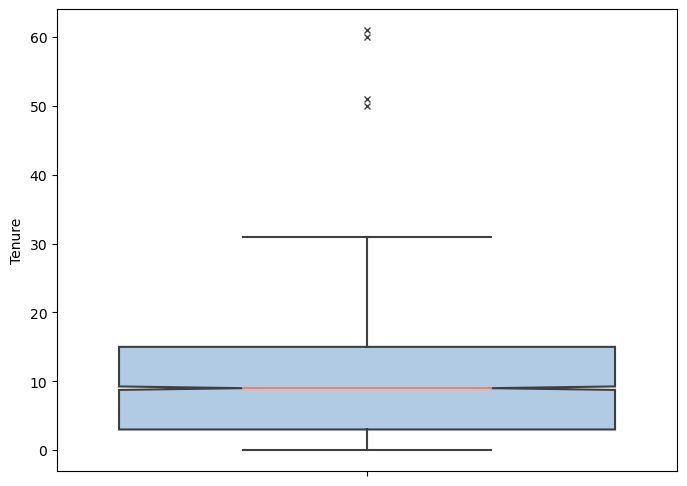

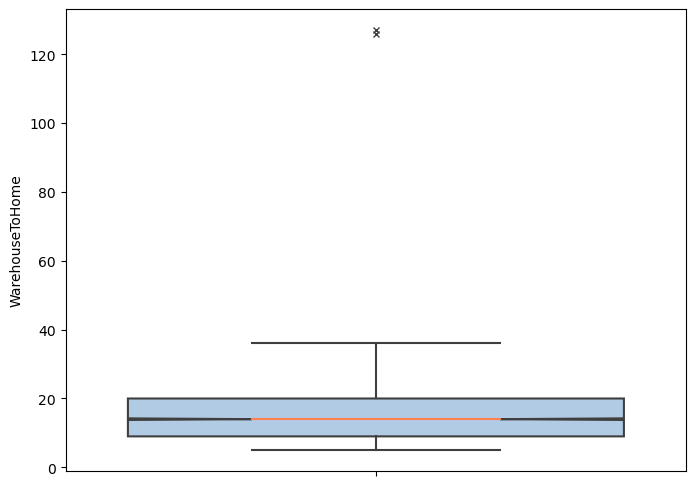

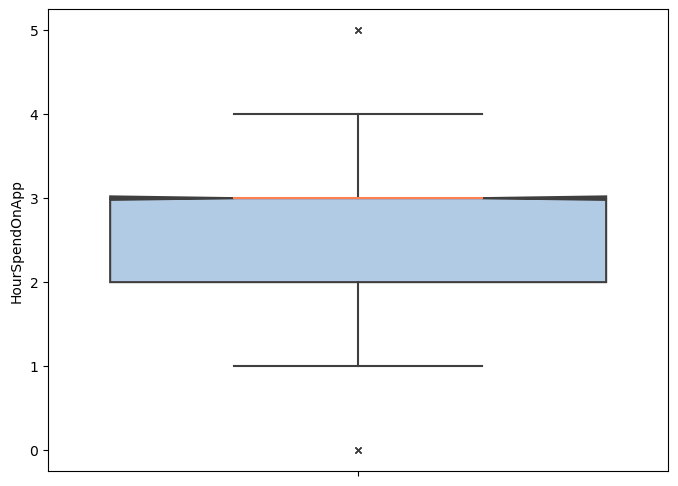

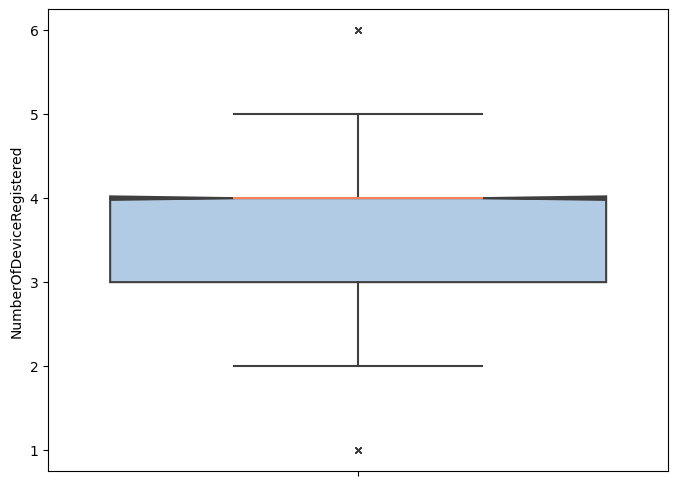

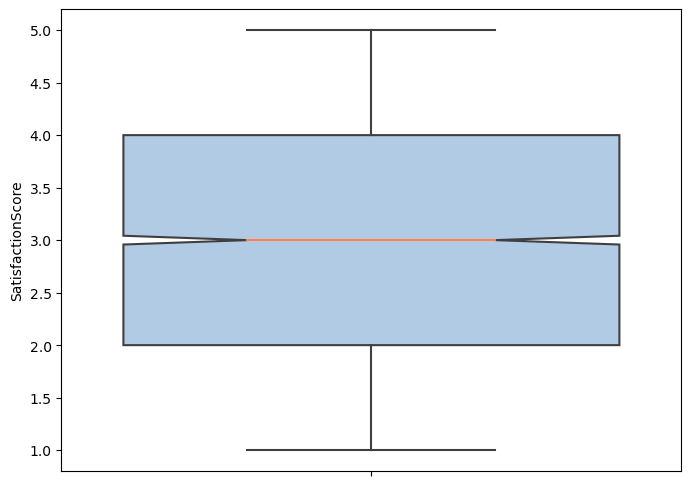

...

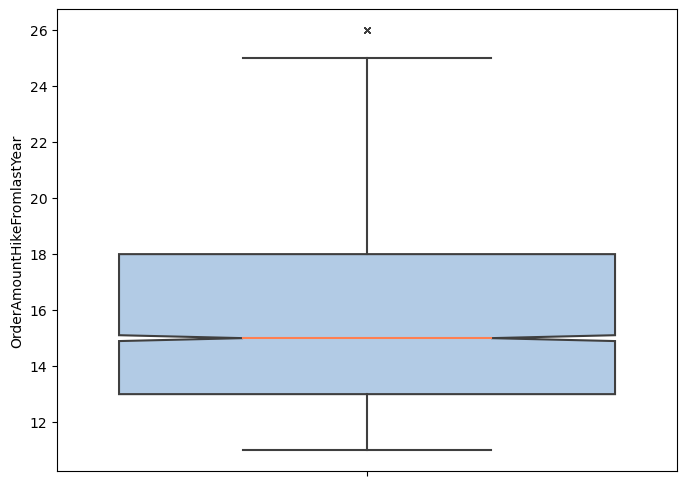

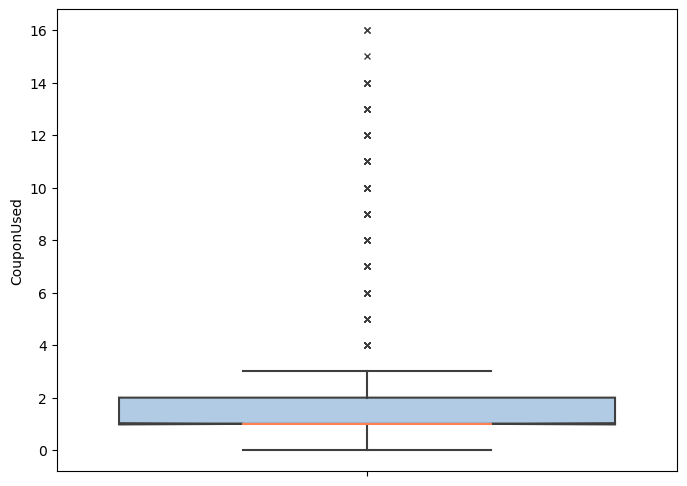

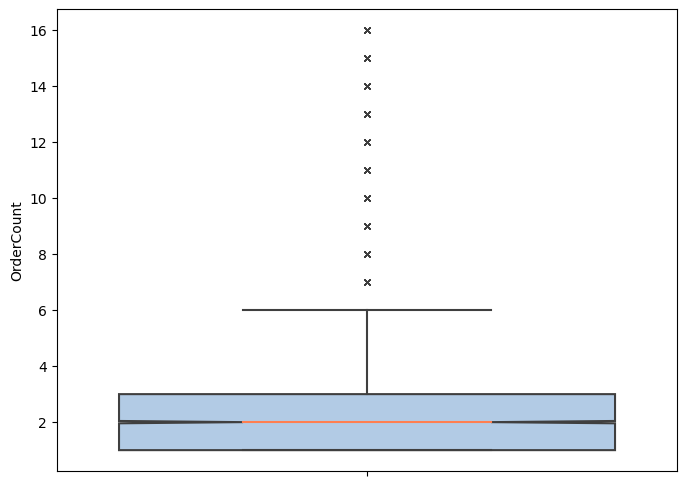

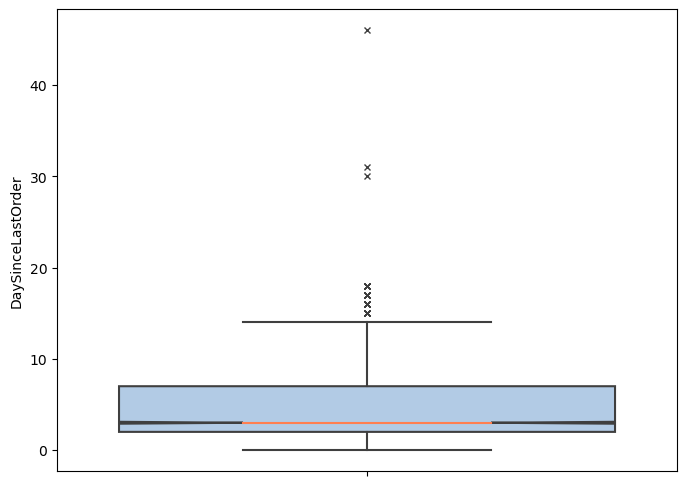

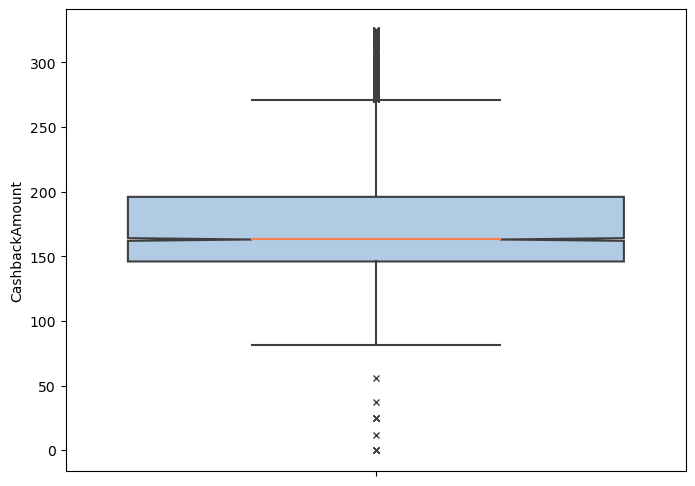

In [224]:
#Daha Ayrıntılı bir şekilde bakmak istersek

for feature in df[sayisallar]:   
    plt.figure(figsize=(8,6))
    sns.boxplot(data=df,y=feature,notch=True,showcaps=True,flierprops={'marker':'x'}
                   ,boxprops={"facecolor": (.4, .6, .8, .5)}
                   ,medianprops={"color": "coral"},orient='v')
    plt.show()


### Aykırı Değerleri Düzeltelim

In [225]:

def outlier_modifier(df, sutun_ismi):
    Q1 = df[sutun_ismi].quantile(0.25)
    Q3 = df[sutun_ismi].quantile(0.75)
    IQR = Q3 - Q1

    alt_sinir = Q1 - 1.5 * IQR
    ust_sinir = Q3 + 1.5 * IQR

    alt_outlier = df[sutun_ismi] < alt_sinir
    ust_outlier = df[sutun_ismi] > ust_sinir

    df.loc[alt_outlier, sutun_ismi] = Q1
    df.loc[ust_outlier, sutun_ismi] = Q3

    return df



In [226]:

for sutun_ismi in df.select_dtypes(include = [np.number]).columns:
    df = outlier_modifier(df, sutun_ismi)


In [227]:
'''
from scipy.stats import zscore

def zscore_outlier(df, feature, z_threshold=2.5):
    # Z skorlarını hesapla
    z_skoru = zscore(df[feature])
    
    # Aykırı değerleri belirle
    alt_outliers = z_skoru > z_threshold
    ust_outliers = z_skoru < -z_threshold
    
    # Aykırı değerleri doldur (bu örnekte Q3 ve Q1 kullanıldı)
    Q3 = df[feature].quantile(0.75)
    Q1 = df[feature].quantile(0.25)

    df.loc[ust_outliers, feature] = Q3
    df.loc[alt_outliers, feature] = Q1
    
    return df

for feature in df.select_dtypes(include=[np.number]).columns:
    df = zscore_outlier(df, feature)
'''

'\nfrom scipy.stats import zscore\n\ndef zscore_outlier(df, feature, z_threshold=2.5):\n    # Z skorlarını hesapla\n    z_skoru = zscore(df[feature])\n    \n    # Aykırı değerleri belirle\n    alt_outliers = z_skoru > z_threshold\n    ust_outliers = z_skoru < -z_threshold\n    \n    # Aykırı değerleri doldur (bu örnekte Q3 ve Q1 kullanıldı)\n    Q3 = df[feature].quantile(0.75)\n    Q1 = df[feature].quantile(0.25)\n\n    df.loc[ust_outliers, feature] = Q3\n    df.loc[alt_outliers, feature] = Q1\n    \n    return df\n\nfor feature in df.select_dtypes(include=[np.number]).columns:\n    df = zscore_outlier(df, feature)\n'

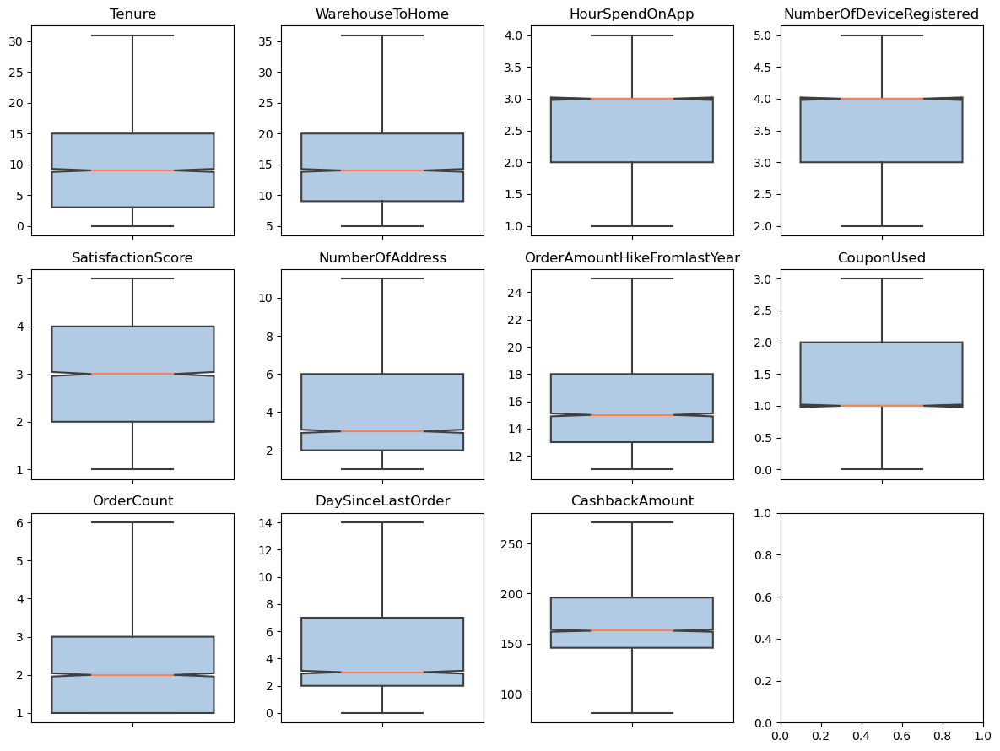

In [228]:
boxplot_maker(sayisallar)

In [229]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Tenure,5630.0,10.105329,8.269881,0.0,3.0,9.0,15.0,31.0
WarehouseToHome,5630.0,15.528952,8.080106,5.0,9.0,14.0,20.0,36.0
HourSpendOnApp,5630.0,2.934636,0.700981,1.0,2.0,3.0,3.0,4.0
NumberOfDeviceRegistered,5630.0,3.714920,0.784175,2.0,3.0,4.0,4.0,5.0
SatisfactionScore,5630.0,3.066785,1.380194,1.0,2.0,3.0,4.0,5.0
NumberOfAddress,5630.0,4.203730,2.547098,1.0,2.0,3.0,6.0,11.0
OrderAmountHikeFromlastYear,5630.0,15.627709,3.507160,11.0,13.0,15.0,18.0,25.0
CouponUsed,5630.0,1.272824,0.824968,0.0,1.0,1.0,2.0,3.0
OrderCount,5630.0,2.146004,1.142066,1.0,1.0,2.0,3.0,6.0
DaySinceLastOrder,5630.0,4.346536,3.282812,0.0,2.0,3.0,7.0,14.0


### Yeni Özellik Oluşturma

In [230]:
# Tenure ve OrderCount arasında Tenure biriminde Ort_OrderCount değişkeni ile geçirdiği zaman başına sipariş sayısını hesaplayabilirdik.Fakat Tenure'de 700 civarı 0 değeri var ve 0'a bölme hatası ortaya çıkıcaktı.
# Bu durumda 0 ları 1 yapınca sutunun yuzde 20 si değişmiş olacağı için yapmadık.
# Bunun yerine CashbackAmount ve OrderCount dan sipariş başına geri ödemeyi hesaplayabiliriz.

In [231]:
df['Ort_Cashback_Siparis_Basina'] = df['CashbackAmount'] / df['OrderCount']

In [232]:
df['Ort_Cashback_Siparis_Basina']

0       160.000000
1       121.000000
2       120.000000
3       134.000000
4       130.000000
5        23.166667
6       121.000000
7        61.500000
8       127.000000
9       123.000000
10       65.333333
11      154.000000
12       67.000000
13      134.000000
14       49.000000
15      121.000000
16      129.000000
17      157.000000
18      161.000000
19       37.500000
20       54.000000
21       67.666667
22      117.000000
23       73.000000
24      207.000000
25      142.000000
26      173.000000
27       30.750000
28      123.000000
29       63.333333
30      143.000000
31      161.000000
32      133.000000
33      104.500000
34      122.000000
35       61.500000
36       60.000000
37      127.000000
38      194.000000
39      126.000000
40       49.000000
41      125.000000
42       64.666667
43      187.000000
44      130.000000
45      131.000000
46      123.000000
47       40.333333
48       21.833333
49      150.000000
50       71.500000
51      125.000000
52      111.

In [233]:
sayisallar.append('Ort_Cashback_Siparis_Basina')

In [234]:
# Şuanki müşterilerin yüzde kaçı kayıp durumunda
churn_true = df[df['Churn'] == 1]['Churn'].count()
churn_false = df[df['Churn'] == 0]['Churn'].count()
yuzde_churn = churn_true*100 / churn_false

In [235]:
yuzde_churn

20.24775736864588

### Görseleştirmeler ve Analiz


In [236]:
for feature in kategorikler:
    print(feature, '\n')
    print(df[feature].value_counts())

Churn 

Churn
0    4682
1     948
Name: count, dtype: int64
PreferredLoginDevice 

PreferredLoginDevice
Mobile Phone    2765
Computer        1634
Phone           1231
Name: count, dtype: int64
CityTier 

CityTier
1    3666
3    1722
2     242
Name: count, dtype: int64
PreferredPaymentMode 

PreferredPaymentMode
Debit Card          2314
Credit Card         1501
E wallet             614
UPI                  414
COD                  365
CC                   273
Cash on Delivery     149
Name: count, dtype: int64
Gender 

Gender
Male      3384
Female    2246
Name: count, dtype: int64
PreferedOrderCat 

PreferedOrderCat
Laptop & Accessory    2050
Mobile Phone          1271
Fashion                826
Mobile                 809
Grocery                410
Others                 264
Name: count, dtype: int64
MaritalStatus 

MaritalStatus
Married     2986
Single      1796
Divorced     848
Name: count, dtype: int64
Complain 

Complain
0    4026
1    1604
Name: count, dtype: int64


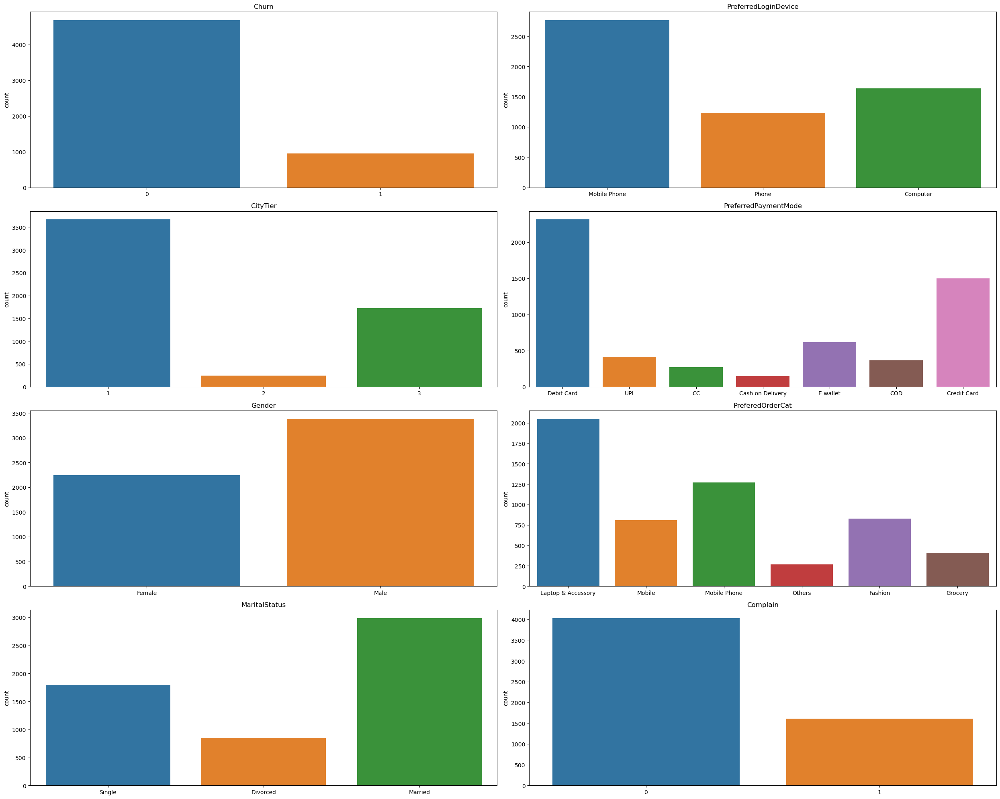

In [237]:
# Kategorik Değişkenlerimizin frekanslarını görselleştirelim. 
plt.figure(figsize = (25, 20))
for i, feature in enumerate(kategorikler, 1):
    plt.subplot(4, 2, i)
    sns.countplot(data = df, x = feature)
    plt.title(feature)
    plt.xlabel("")
plt.tight_layout()
plt.show()



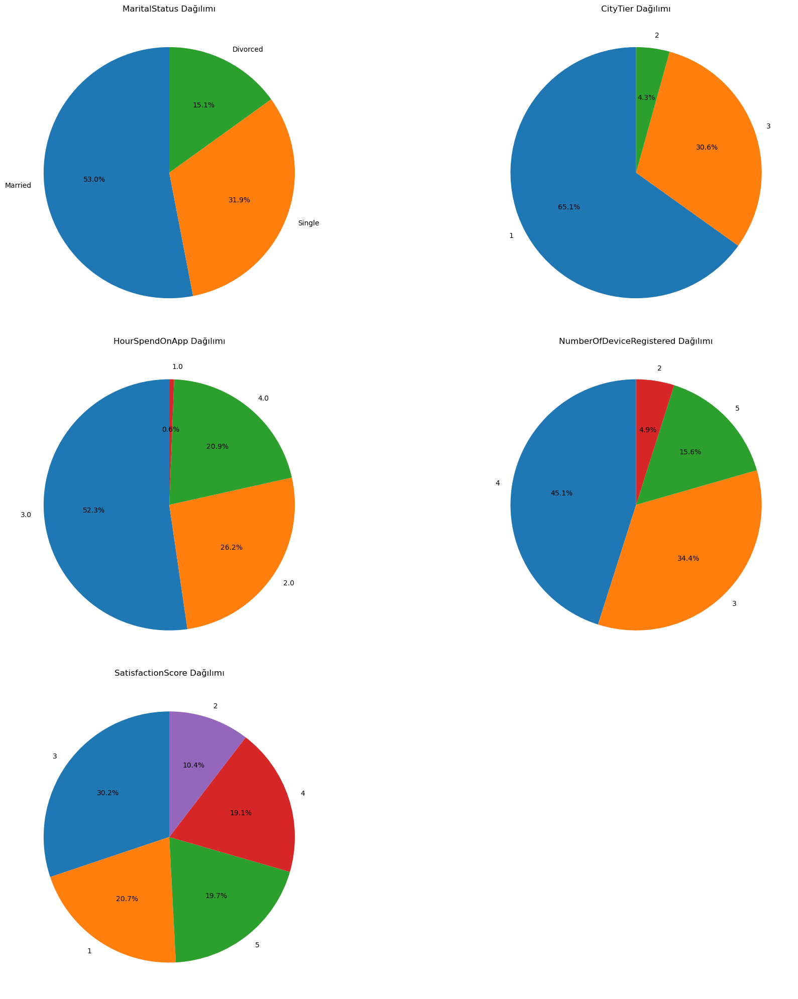

In [238]:
ucten_fazla = ['MaritalStatus','CityTier', 'HourSpendOnApp', 'NumberOfDeviceRegistered', 'SatisfactionScore']

# subplotlar
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (20, 20))

# 3 ten fazla eşşiz değeri olan kategorikleri görselleştir
for i, feature in enumerate(ucten_fazla):   # enumerate ile ucten_fazla içinde dolaşırken değeri ve indexini tutarız.
    if i < len(axs.flat):
        # Değerlerin sayısını hesaplayalım
        deger_freq = df[feature].value_counts()

        # Grafiği oluşturalım
        axs.flat[i].pie(deger_freq, labels = deger_freq.index, autopct = '%1.1f%%', startangle = 90)

        # Her grafik için başlıklarımızı oluşturalım
        axs.flat[i].set_title(f'{feature} Dağılımı')
        
axs[2,1].remove()   # 6 hücre yaptık birisini kaldıralım

# Grafikleri sığdırmak için
fig.tight_layout()

plt.show()

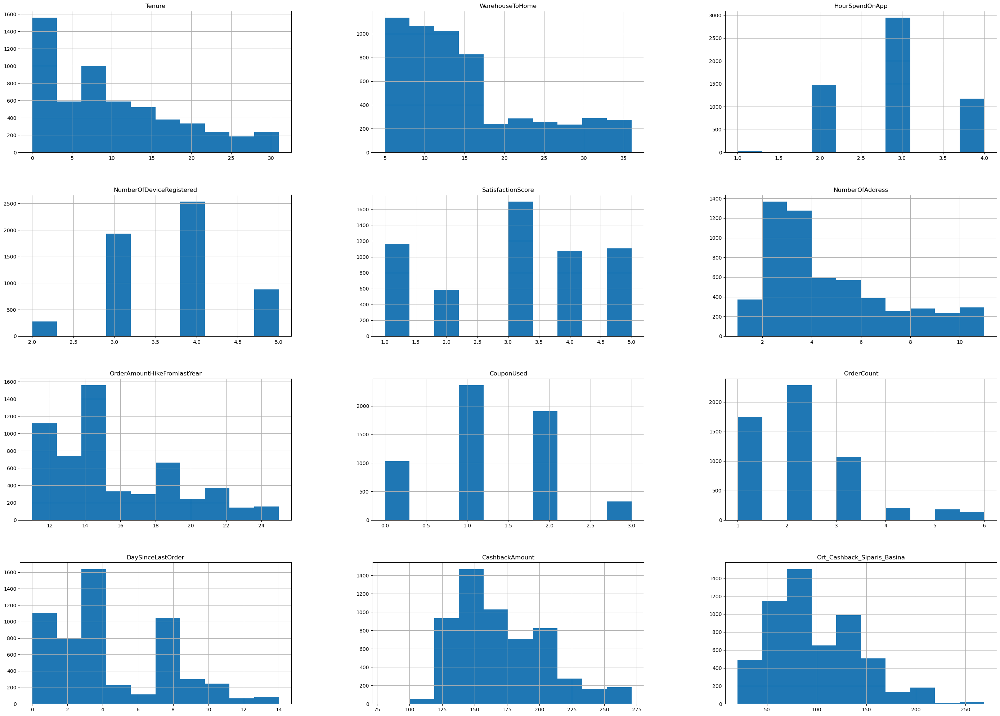

In [239]:
# hist plot ile sayısal değişkenlerin dağılımını,sağ sola eğim var mı kontrolünü yaparız
# Merkezi eğpilimini kontrol ederiz kaç tane tepe var,tek zirve olanların bir merkezi değerde yoğunlaştığını söyleyebiliriz
df[sayisallar].hist(figsize = (35,25))  
plt.show()

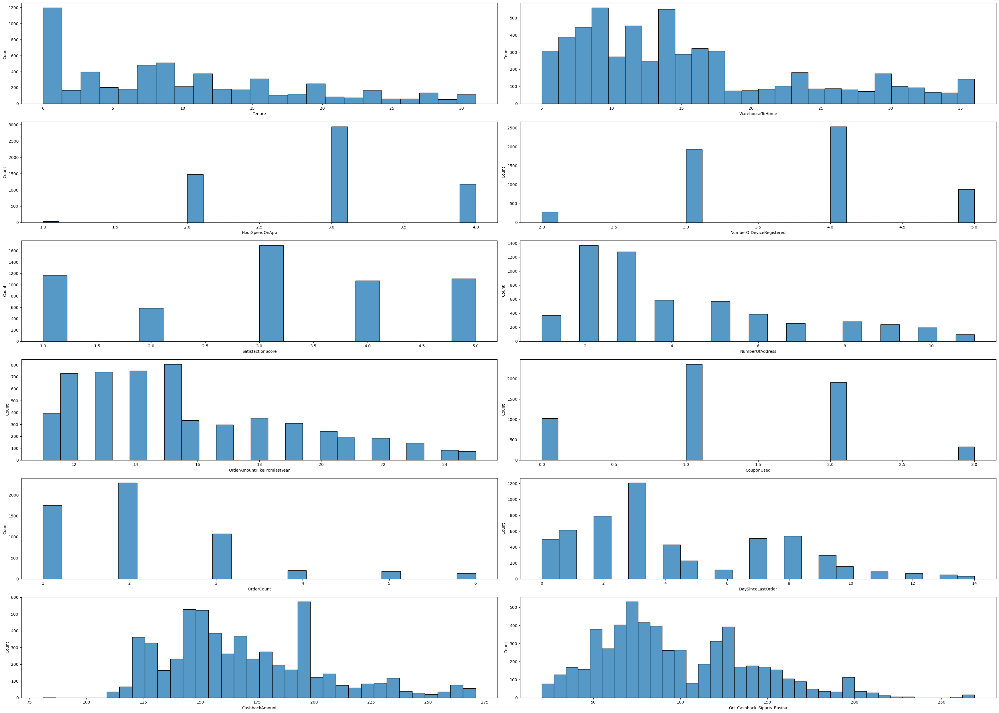

In [240]:
# Alternatif sayisal değişkenlerin görseleştirilmesi
fig, ax = plt.subplots(6, 2, figsize = (35, 25))
for feature, subplot in zip(sayisallar, ax.flatten()):
    sns.histplot(df[feature], ax = subplot)

plt.tight_layout()
plt.show()


## Churn ile Diğer Özellikler Arasında Bar Grafik

### Kategorikler ve Churn

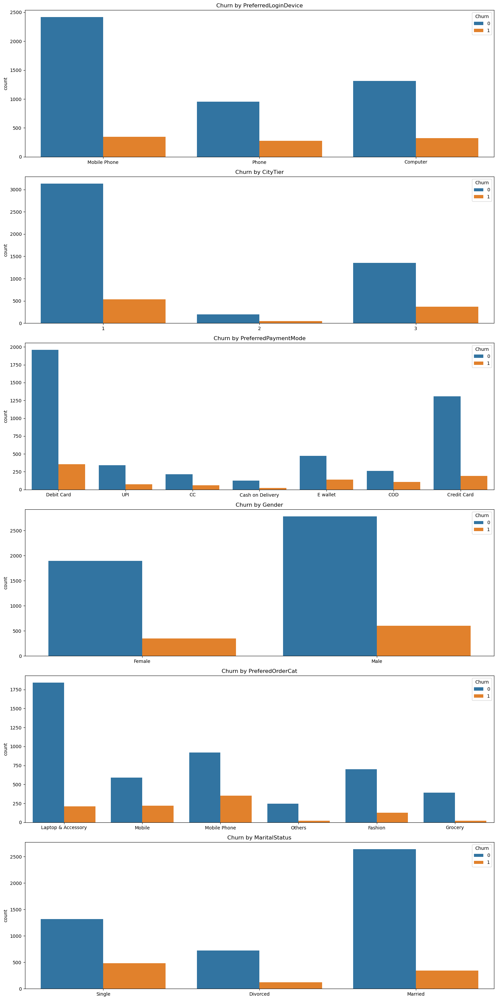

In [241]:

# Plot countplots for each categorical feature against 'Churn'
fig, ax = plt.subplots(6, 1, figsize = (15, 30))
churnsuz_kat = kategorikler.copy()
churnsuz_kat.remove('Churn')
for feature, ax1 in zip(churnsuz_kat, ax.flatten()):
        sns.countplot(data = df, x = feature, hue = 'Churn', ax = ax1)
        ax1.set_title(f'Churn by {feature}')
        ax1.set_xlabel('')
        ax1.legend(title = 'Churn', loc = 'upper right')

plt.tight_layout()
plt.show()


### Sayısallar ve Churn

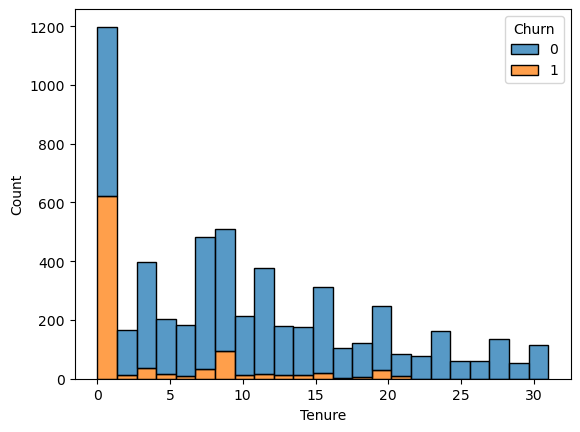

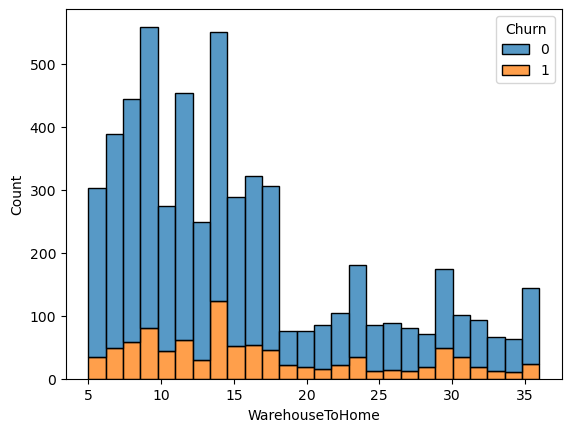

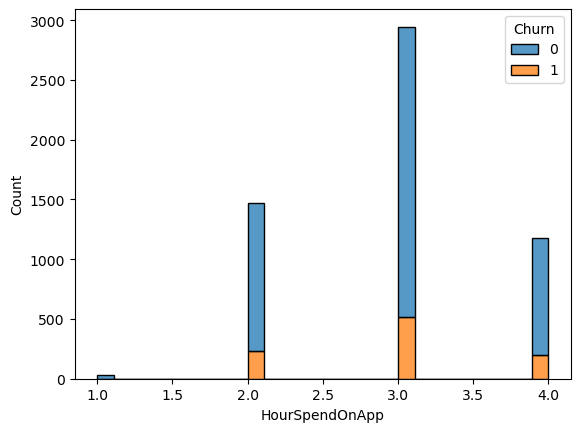

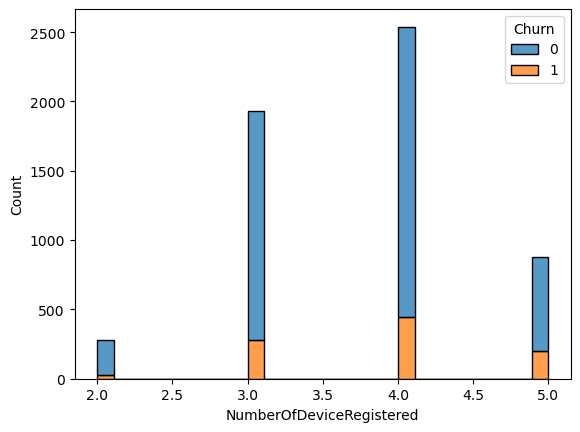

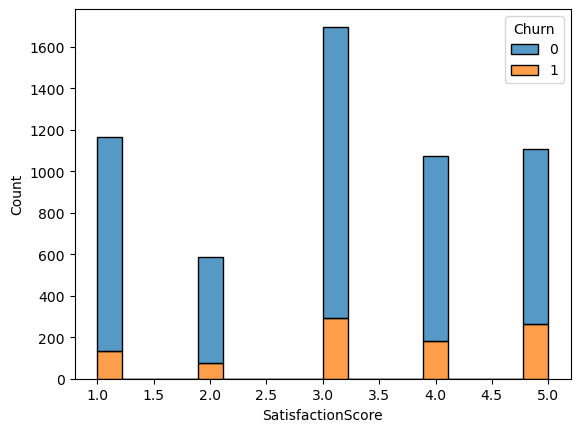

...

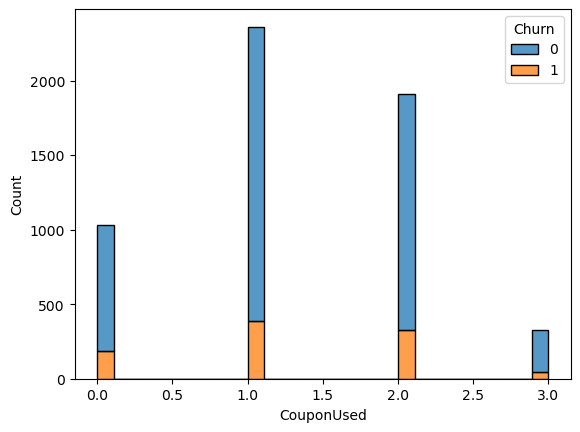

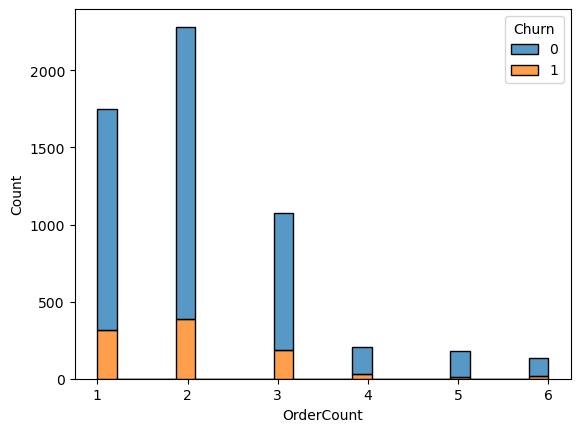

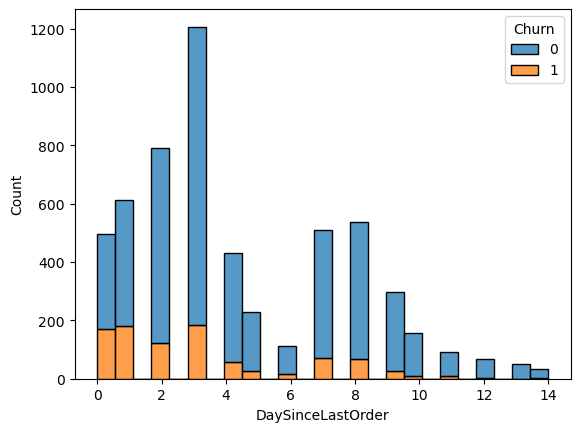

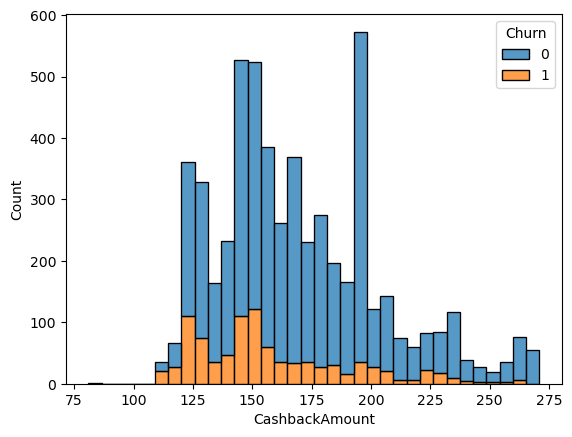

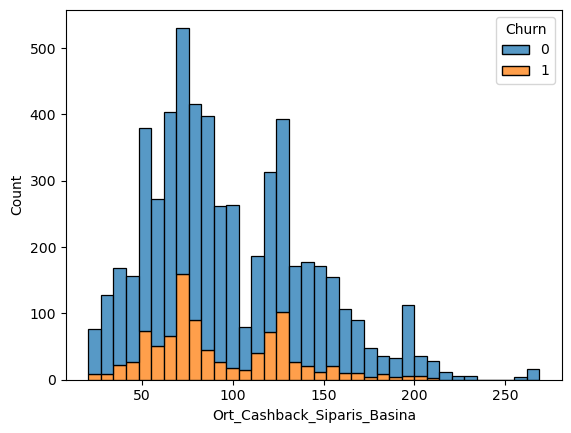

In [242]:
#Churn e karşı Histplotlar
# 1 Tenure ve Churn
sns.histplot(df, x = 'Tenure', hue ='Churn', multiple = 'stack', legend = True)
plt.show()

# 2 WarehouseToHome ve Churn
sns.histplot(df, x = 'WarehouseToHome', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 3 HourSpendOnApp ve Churn
sns.histplot(df, x = 'HourSpendOnApp', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 4 NumberOfDeviceRegistered ve Churn
sns.histplot(df, x = 'NumberOfDeviceRegistered', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 5 SatisfactionScore ve Churn
sns.histplot(df, x = 'SatisfactionScore', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 6 NumberOfAddress ve Churn
sns.histplot(df, x = 'NumberOfAddress', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 7 OrderAmountHikeFromlastYear ve Churn
sns.histplot(df, x = 'OrderAmountHikeFromlastYear', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 8 CouponUsed ve Churn
sns.histplot(df, x = 'CouponUsed', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 9 OrderCount ve Churn
sns.histplot(df, x = 'OrderCount', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 10 DaySinceLastOrder ve Churn
sns.histplot(df, x = 'DaySinceLastOrder', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 11 CashbackAmount ve Churn
sns.histplot(df, x = 'CashbackAmount', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 12 Ort_Cashback_Siparis_Basina ve Churn
sns.histplot(df, x = 'Ort_Cashback_Siparis_Basina', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

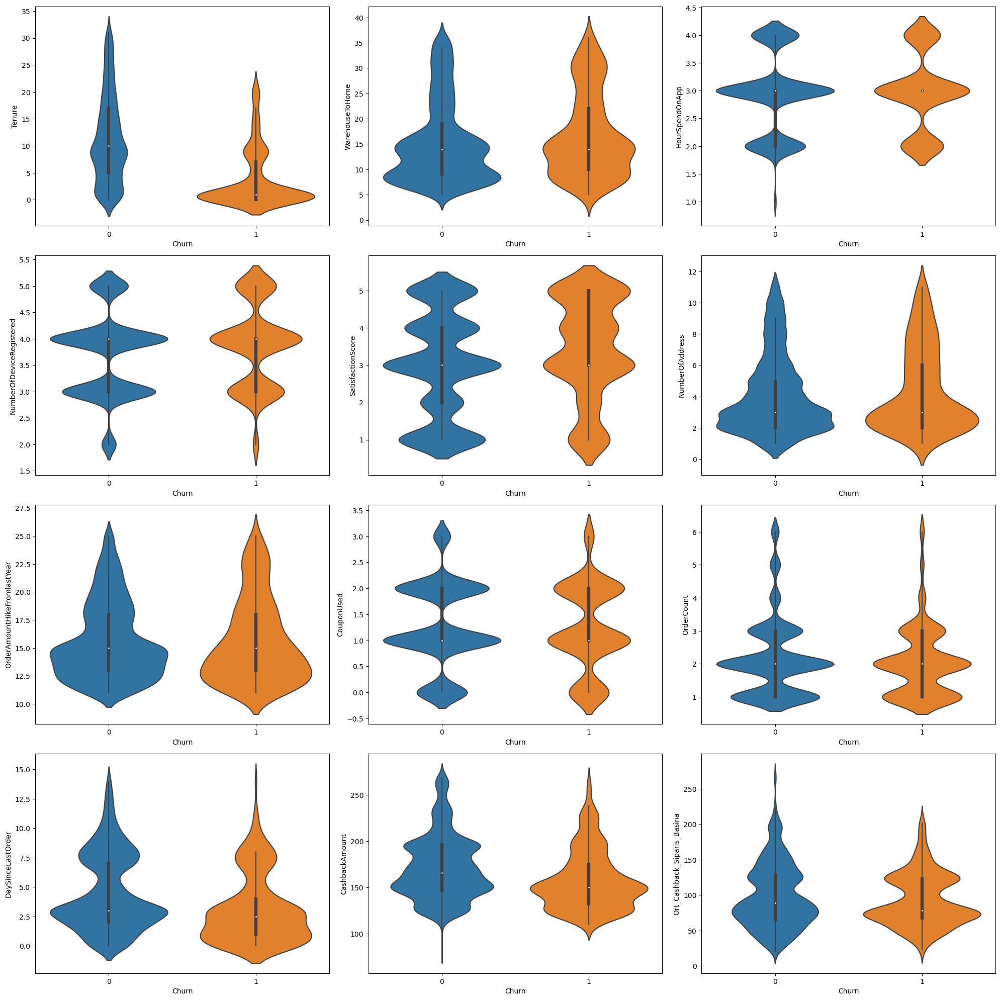

In [243]:
# Histplotda ilk bakışta gözükmeyen bazı durumlar için violinplot yapalım.

fig , ax1 = plt.subplots(nrows = 4 ,ncols = 3, figsize = (20,20))
ax1 = ax1.flatten()

for i, feature in enumerate(sayisallar):
    sns.violinplot(data = df, x = 'Churn', y = feature, ax = ax1[i])    # Hangi hücreye yerleştirileceğini söyler
fig.tight_layout()

plt.show()

In [244]:
# Churn ile Diğer Değişkenler arasındaki ilişkiyi biraz daha ayrıntılı incelemek için
# Churn üzerinde işlem yaparak kayıp müşteri,yüzde kayıp ev toplam müşteri olarak churn'den 3 parça oluşturduk


In [245]:
# Churn özelliğine yakından bakış

import pandas as pd

tables = {}

for feature in df.columns:
    kayip_musteri = df[feature].groupby(by = df['Churn']).value_counts()[1]
    toplam_musteri = df[feature].value_counts()
    kayip_musteri.sort_index(inplace = True)
    toplam_musteri.sort_index(inplace = True)
    toplam_basina_yuzde_kayip = kayip_musteri * 100 / toplam_musteri
    table_data = {
        'Kayıp Müşteri' : kayip_musteri,
        'Toplam Müşteri' : toplam_musteri,
        'Kayıp Müşteri Yüzdesi' : toplam_basina_yuzde_kayip
    }
    
    table = pd.DataFrame(table_data)
    table = table.fillna(0)
    tables[feature] = table




In [246]:
import pandas as pd


son_df = pd.DataFrame()  # Boş bir DataFrame oluşturun

for key in tables:
    anlık_df = pd.concat([tables[key]], keys = [key], ignore_index = False, axis = 0)
    son_df = pd.concat([son_df, anlık_df], axis = 0)


pd.set_option('display.max_rows', None)

In [247]:
son_df.head()

Kayıp Müşteri  Toplam Müşteri  Kayıp Müşteri Yüzdesi
Churn  0.0            0.0            4682               0.000000
       1.0          948.0             948             100.000000
Tenure 0.0          272.0             508              53.543307
       1.0          349.0             690              50.579710
       2.0           14.0             167               8.383234

### Grafik Oluşturan Fonksiyonlar


In [248]:
def bar_line_maker(feature):

    data = son_df.loc[feature]

    fig, ax1 = plt.subplots(figsize = plt.figaspect(0.5))

    # Bar grafik ile Toplam Müşteri ve Kayıp Müşteriyi aynı barda göstericez
    ax1.bar(data.index, data['Toplam Müşteri'], label = 'Toplam Müşteri', alpha = 0.5)
    ax1.bar(data.index, data['Kayıp Müşteri'], label = 'Kayıp Müşteri', alpha = 0.5)
    ax1.set_xlabel(feature)
    ax1.set_ylabel('Müşteri Sayısı')
    ax1.legend(loc='upper left')

    # Kayıp Müşteri yüzdesini göstermek için line plot ekleyelim
    ax2 = ax1.twinx()               # Aynı x-eksenini kullanıcak
    ax2.plot(data.index, data['Kayıp Müşteri Yüzdesi'], color = 'red', marker = '*', markerfacecolor = 'blue', markeredgecolor = 'blue', label = 'Kayıp Müşteri Yüzdesi (%)')
    ax2.set_ylabel('Kayıp Müşteri Yüzdesi (%)')
    ax2.legend(loc = 'upper right')

    plt.show()



In [249]:
churn_true = df[df['Churn'] == 1]['Churn'].count()
churn_false = df[df['Churn'] == 0]['Churn'].count()
yuzde_churn = round(churn_true*100 / churn_false, 2)
# Tüm veri setindeki ortalama kayıp yuzde cinsinden
def graph_maker(feature_name):
        fig, ax1 = plt.subplots(figsize = (12, 6), dpi = 150)
        color = 'tab:blue'
        color1 = 'tab:orange'
        color2 = 'tab:brown'
        ax1.set_xlabel(df[feature_name].name)
        ax1.set_ylabel('Müşteri Sayısı', color = color)  
        ax1.plot(son_df.loc[feature_name].index, son_df.loc[feature_name]['Toplam Müşteri'].values, color = color, marker = 'x', label = 'Toplam Müşteri')
        ax1.tick_params(axis='y', labelcolor=color)
        ax1.plot(son_df.loc[feature_name].index, son_df.loc[feature_name]['Kayıp Müşteri'].values, color = color1, marker = 'o', label = 'Kayıp Müşteri')
        
        
        ax2 = ax1.twinx()  
        ax2.set_ylim(-5,)
        
        color = 'tab:orange'
        ax2.plot(son_df.loc[feature_name].index, son_df.loc[feature_name]['Kayıp Müşteri Yüzdesi'].values, color = color2, marker = '*', label = 'Kayıp Müşteri Yüzdesi')
        
        ax2.axhline(y = yuzde_churn, color = 'purple', linestyle = '--')

        
        
        lines1, labels1 = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()

        ax1.legend(lines1 + lines2, labels1 + labels2, loc = 'center right', bbox_to_anchor = (1.3,0.75))
    
        ax2.set_ylabel('Yüzde Müşteri Kayıbı ', color = color2)  
        ax2.tick_params(axis = 'y', labelcolor = color2)
        ax2.autoscale(enable = True, axis = 'y')
        ax1.autoscale(enable = True, axis = 'y')
        sns.despine(ax = ax1, right = True, left = True)
        sns.despine(ax = ax2, left = True, right = False)

        plt.show()


In [250]:
def scatter_maker(feature_name):
        fig, ax1 = plt.subplots(figsize = (12, 6), dpi = 150)
        color = 'tab:blue'
        color1 = 'tab:orange'
        color2 = 'tab:brown'
    
        ax1.set_xlabel(df[feature_name].name)
        ax1.set_ylabel('Müşteri Sayısı', color = color)  
    
        ax1.scatter(son_df.loc[feature_name].index, son_df.loc[feature_name]['Toplam Müşteri'].values, color = color, marker = 'o', label = 'Toplam Müşteri')
        ax1.scatter(son_df.loc[feature_name].index, son_df.loc[feature_name]['Kayıp Müşteri'].values, color = color1, marker = 'o', label = 'Kayıp Müşteri')
        
        ax1.tick_params(axis = 'y', labelcolor = color) 
        ax2 = ax1.twinx()  
        ax2.set_ylim(-5,)
        
        ax2.scatter(son_df.loc[feature_name].index, son_df.loc[feature_name]['Kayıp Müşteri Yüzdesi'].values, color = color2, marker = 'o', label = 'Kayıp Müşteri Yüzdesi')   
        ax2.axhline(y = yuzde_churn, color = 'purple', linestyle = '--')

        
        
        lines1, labels1 = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()

        ax1.legend(lines1 + lines2, labels1 + labels2, loc = 'center right', bbox_to_anchor = (1.3,0.75))
    
        ax2.set_ylabel('Yüzde Müşteri Kayıbı ', color = color2)  
        ax2.tick_params(axis = 'y', labelcolor = color2)
        ax2.autoscale(enable = True, axis = 'y')
        ax1.autoscale(enable = True, axis = 'y')
        sns.despine(ax = ax1, right = True, left = True)     # Daha güzel görünmesi için 
        sns.despine(ax = ax2, left = True, right = False)

        plt.show()

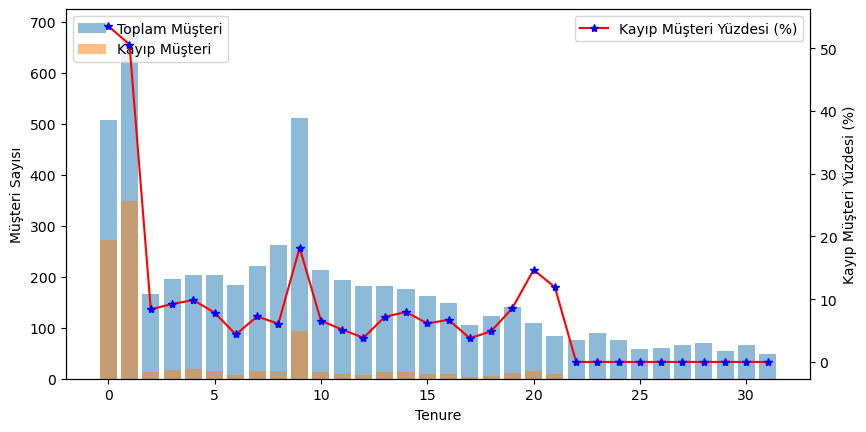

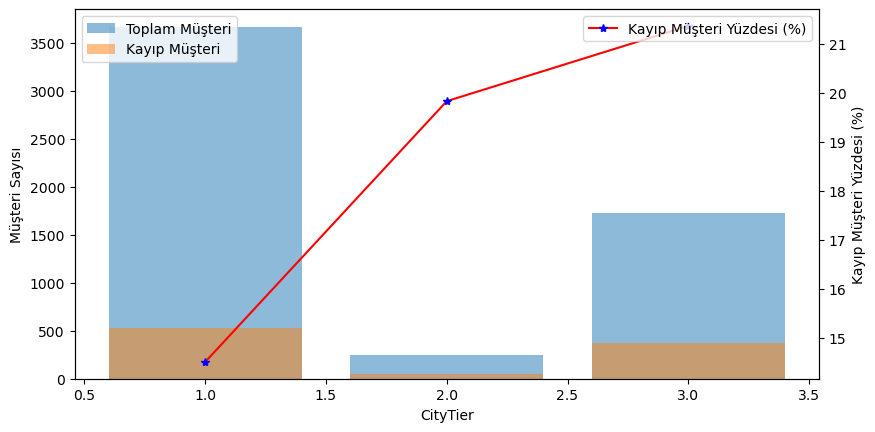

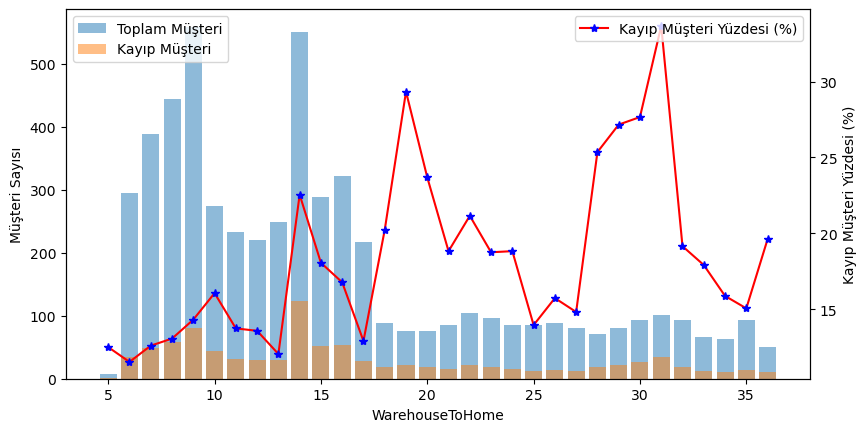

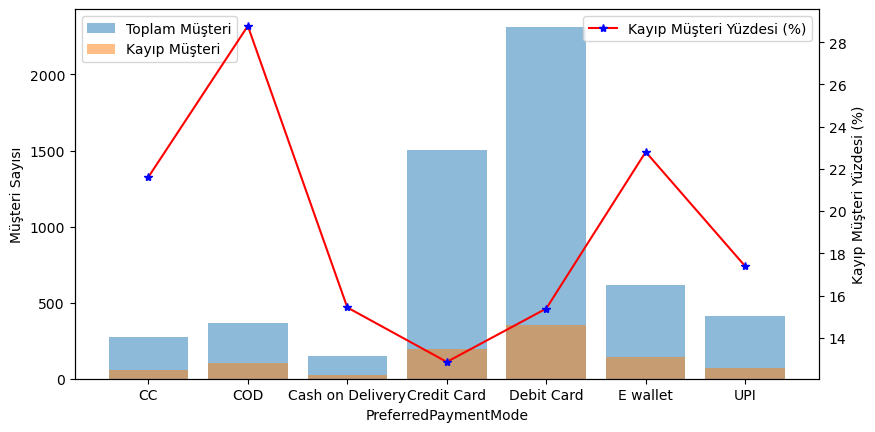

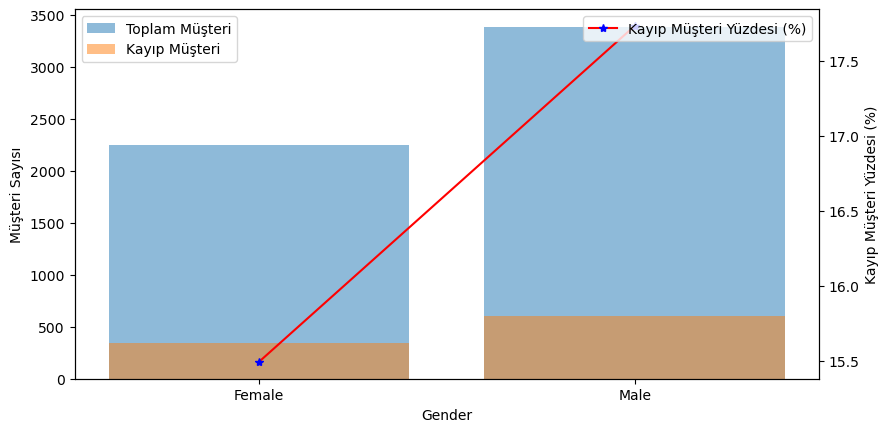

...

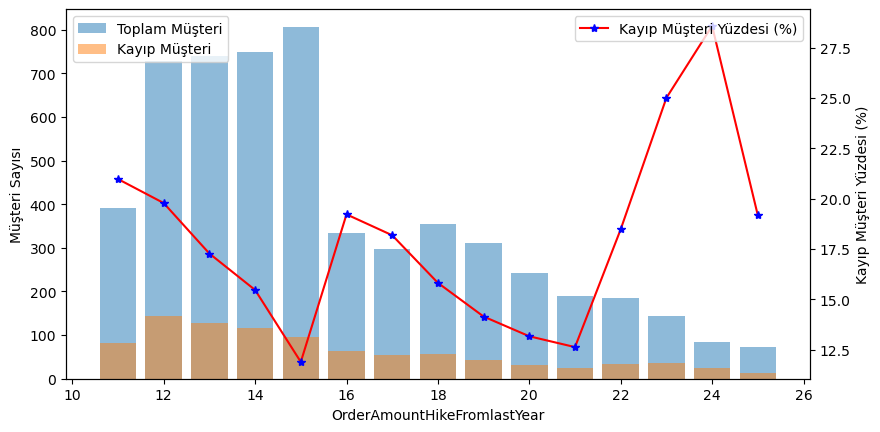

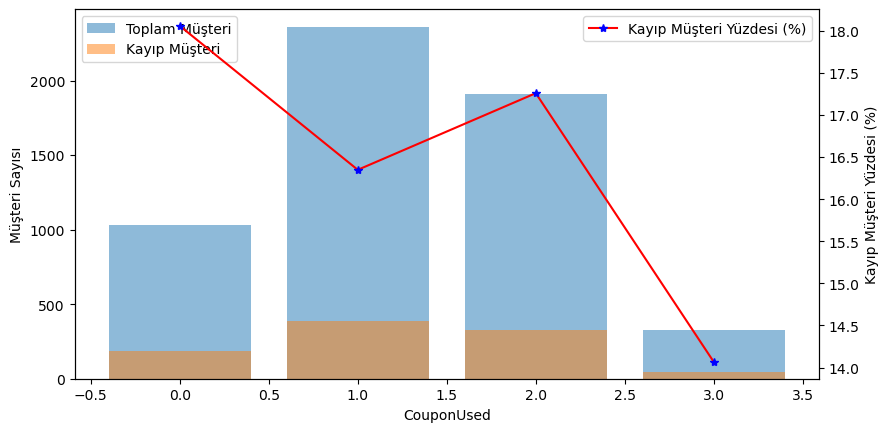

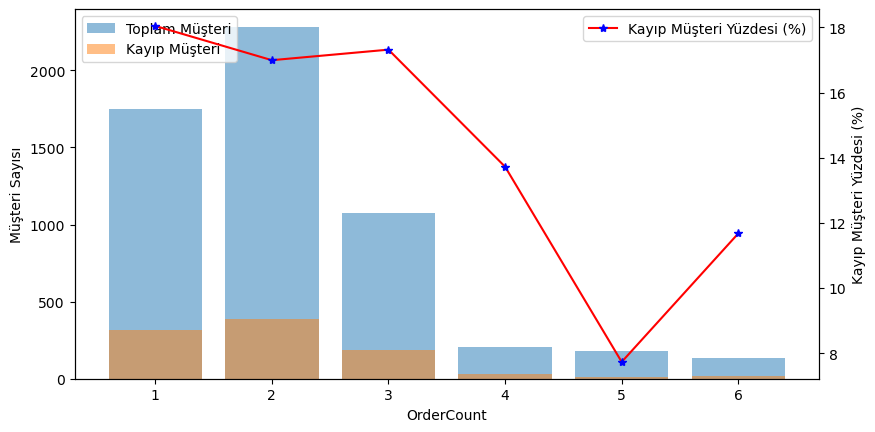

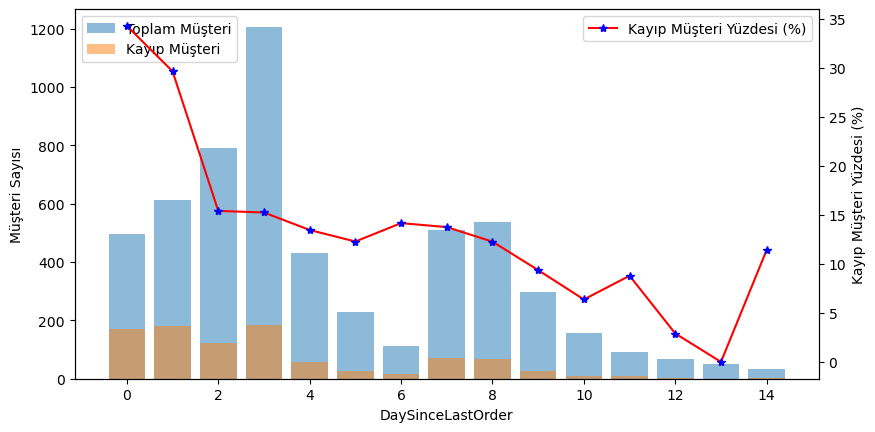

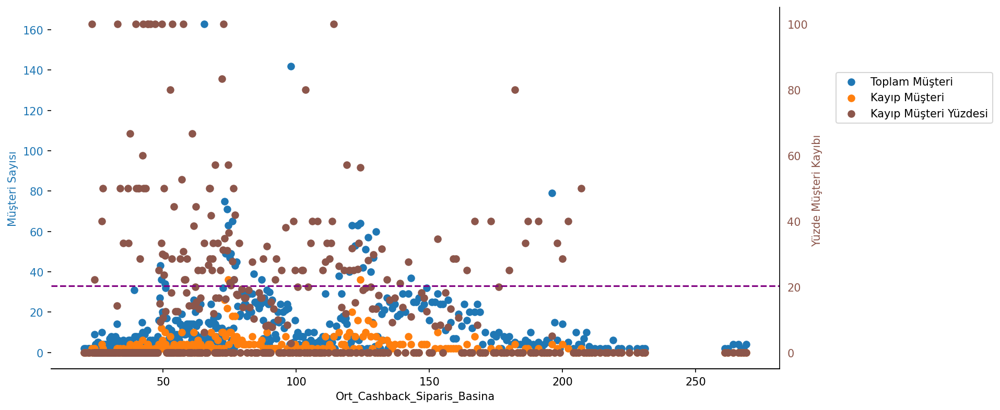

In [251]:
bar_line_maker('Tenure')

bar_line_maker('CityTier')

bar_line_maker('WarehouseToHome')

bar_line_maker('PreferredPaymentMode')

bar_line_maker('Gender')

bar_line_maker('HourSpendOnApp')

bar_line_maker('NumberOfDeviceRegistered')

bar_line_maker('PreferedOrderCat')

bar_line_maker('SatisfactionScore')

bar_line_maker('MaritalStatus')

bar_line_maker('NumberOfAddress')

bar_line_maker('Complain')

bar_line_maker('OrderAmountHikeFromlastYear')

bar_line_maker('CouponUsed')

bar_line_maker('OrderCount')

bar_line_maker('DaySinceLastOrder')

scatter_maker('Ort_Cashback_Siparis_Basina')

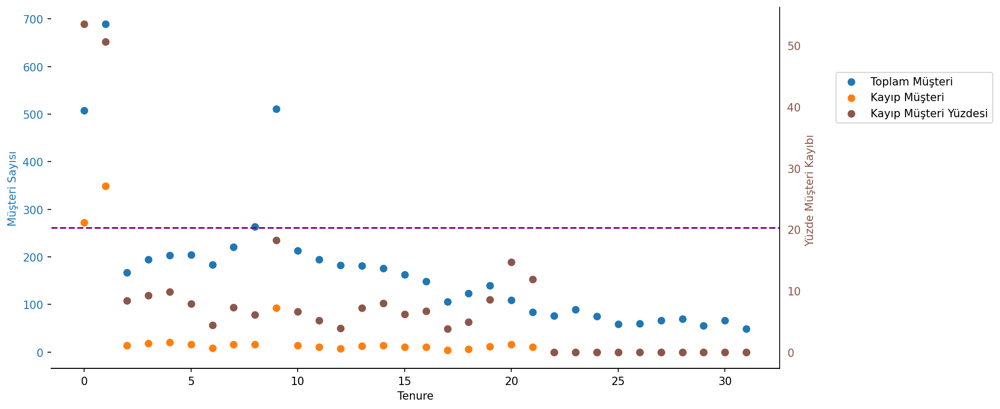

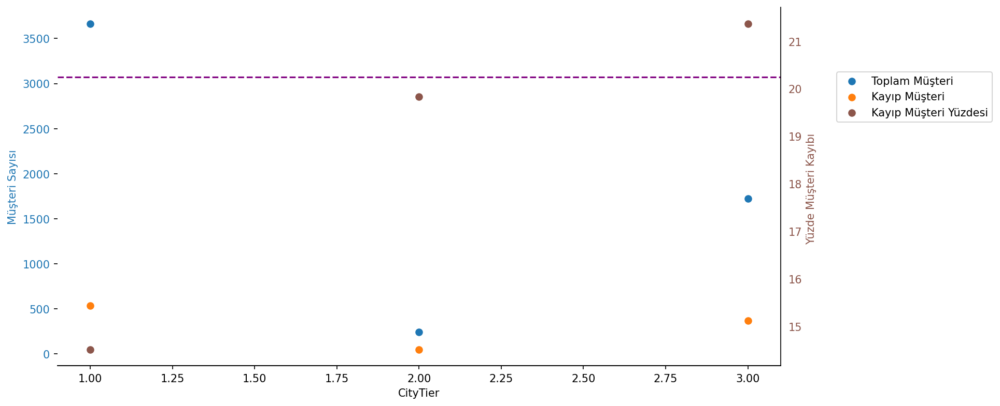

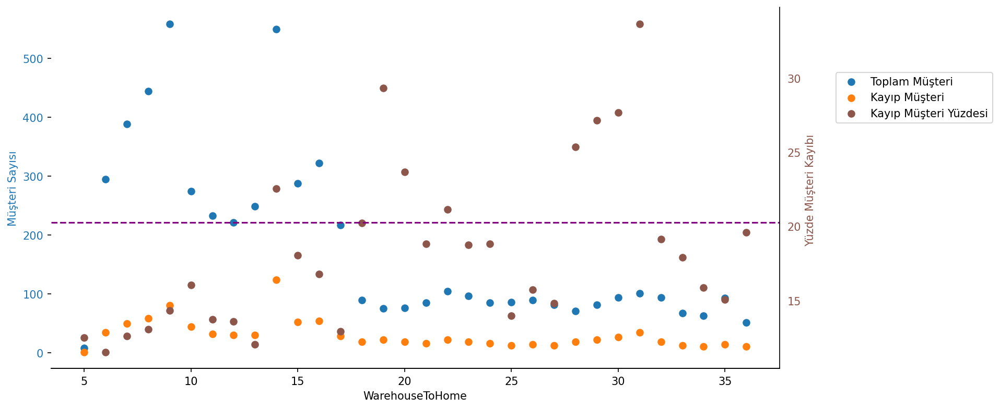

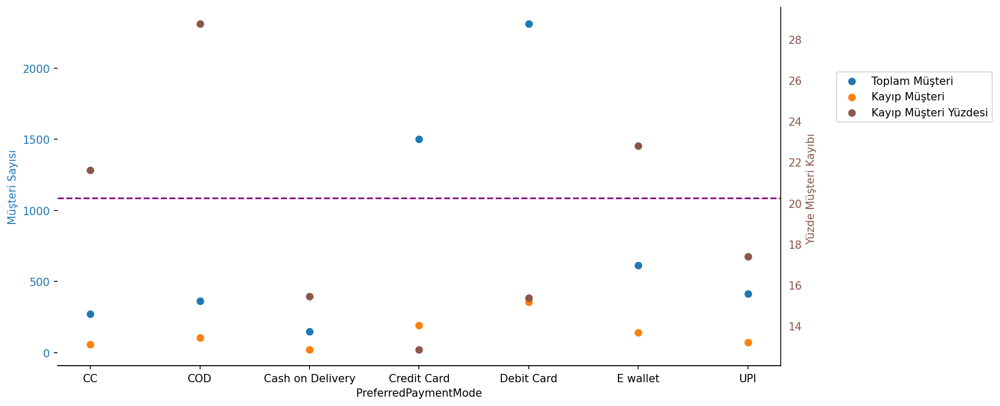

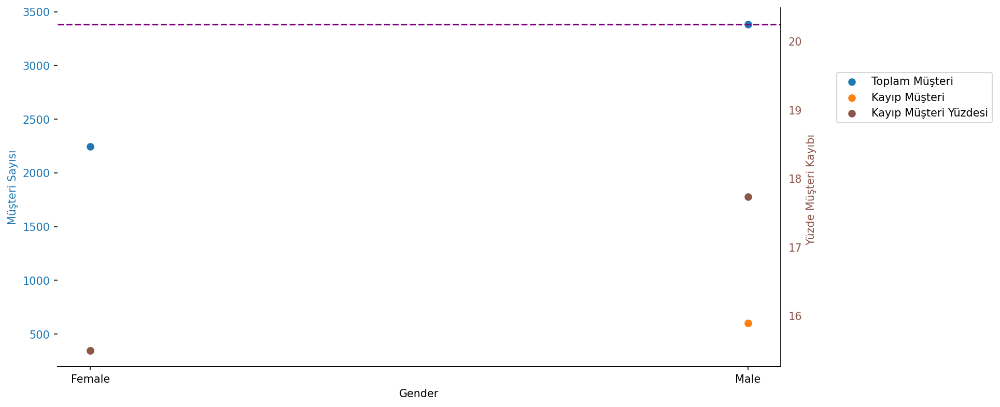

...

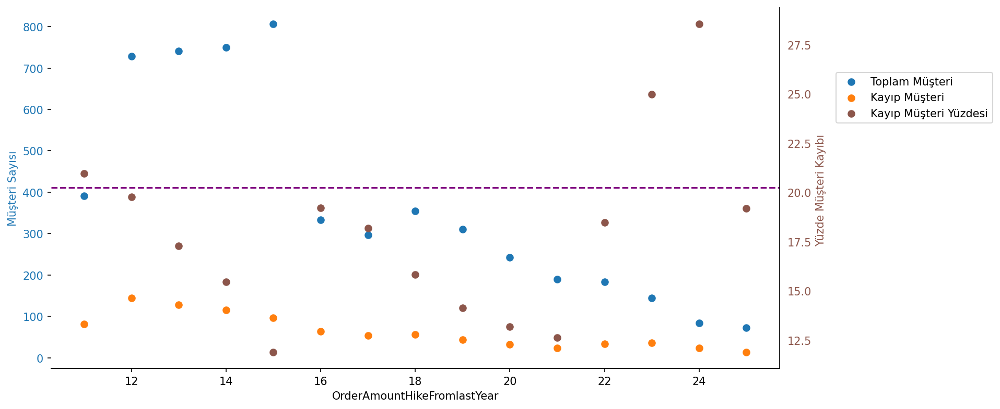

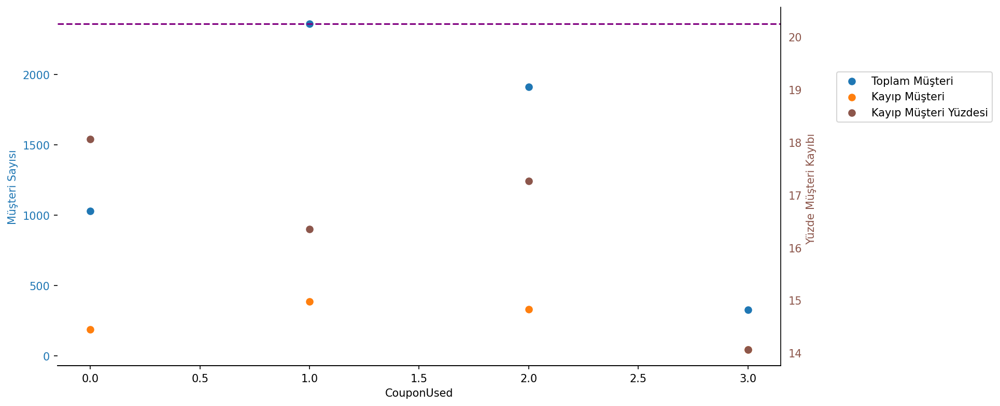

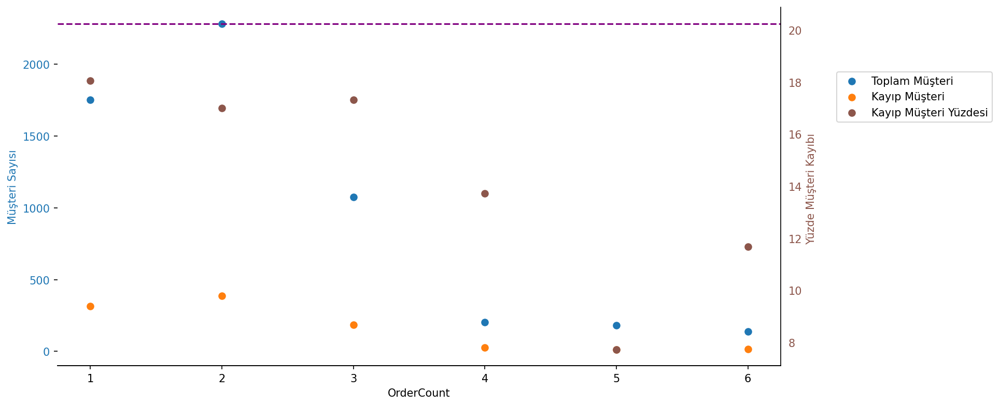

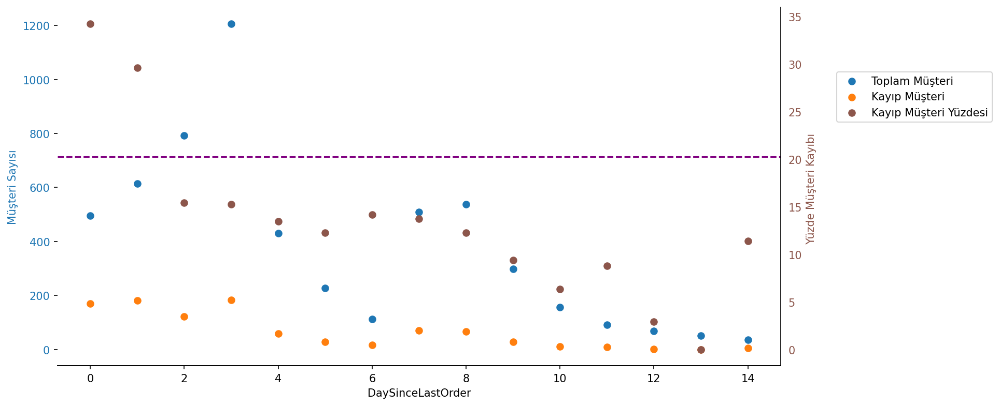

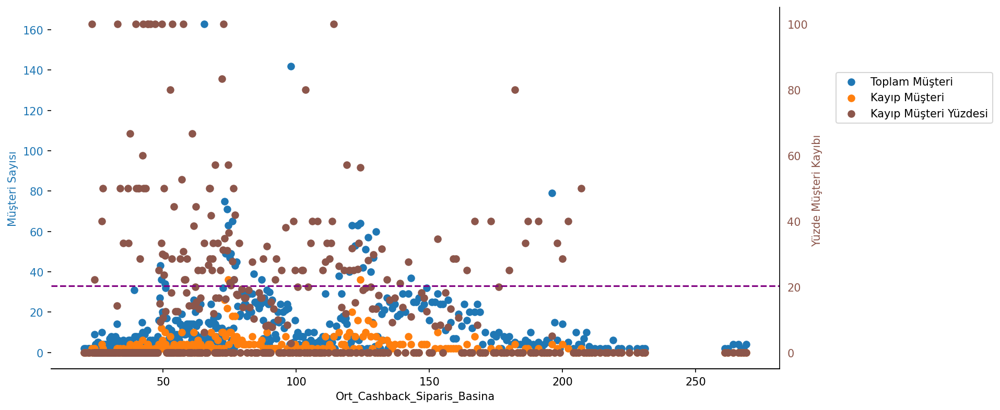

In [252]:
# Gereksiz

scatter_maker('Tenure')

scatter_maker('CityTier')

scatter_maker('WarehouseToHome')

scatter_maker('PreferredPaymentMode')

scatter_maker('Gender')

scatter_maker('HourSpendOnApp')

scatter_maker('NumberOfDeviceRegistered')

scatter_maker('PreferedOrderCat')

scatter_maker('SatisfactionScore')

scatter_maker('MaritalStatus')

scatter_maker('NumberOfAddress')

scatter_maker('Complain')

scatter_maker('OrderAmountHikeFromlastYear')

scatter_maker('CouponUsed')

scatter_maker('OrderCount')

scatter_maker('DaySinceLastOrder')

scatter_maker('Ort_Cashback_Siparis_Basina')

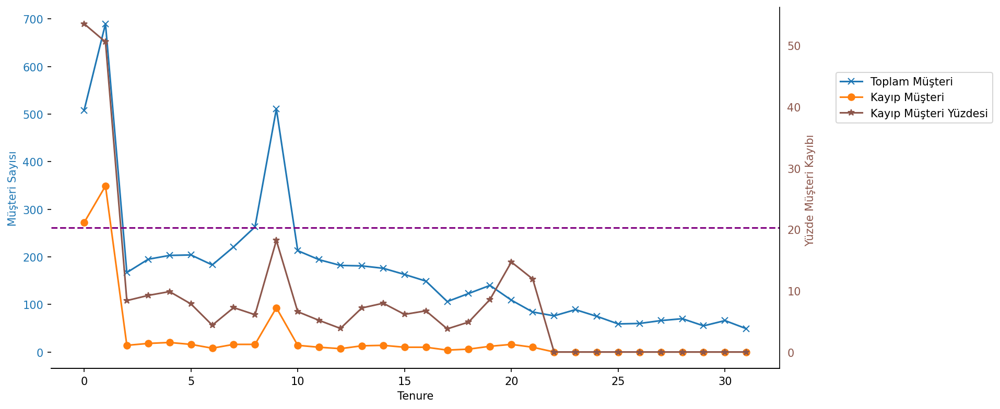

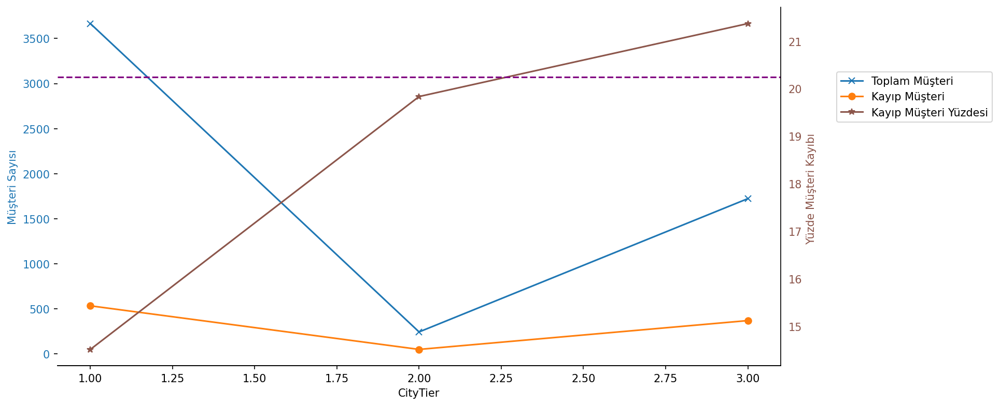

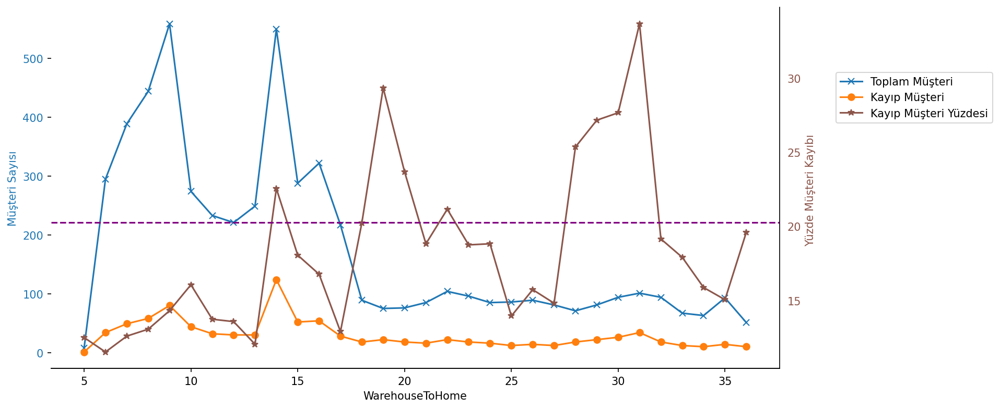

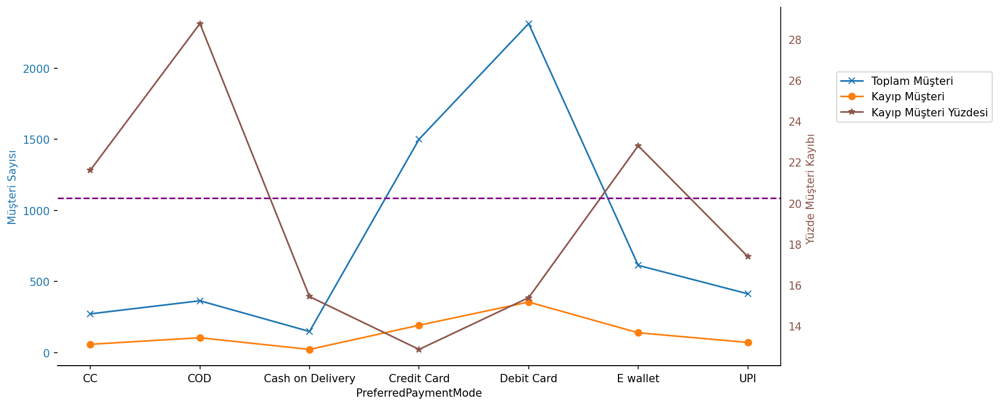

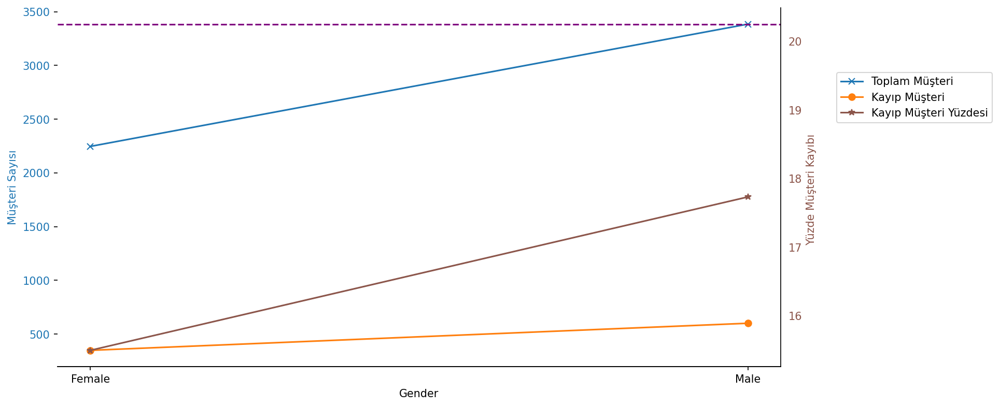

...

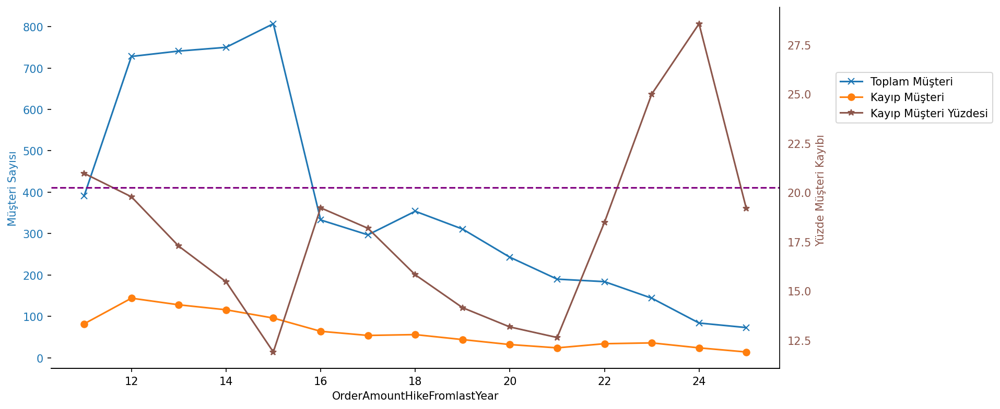

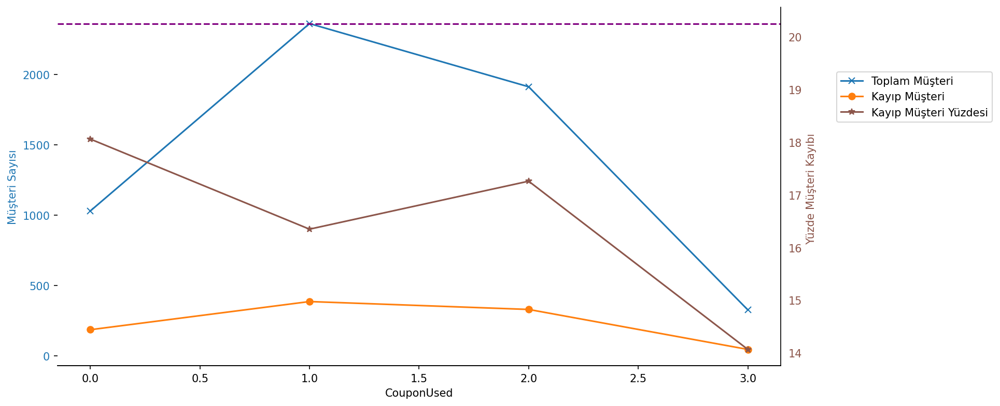

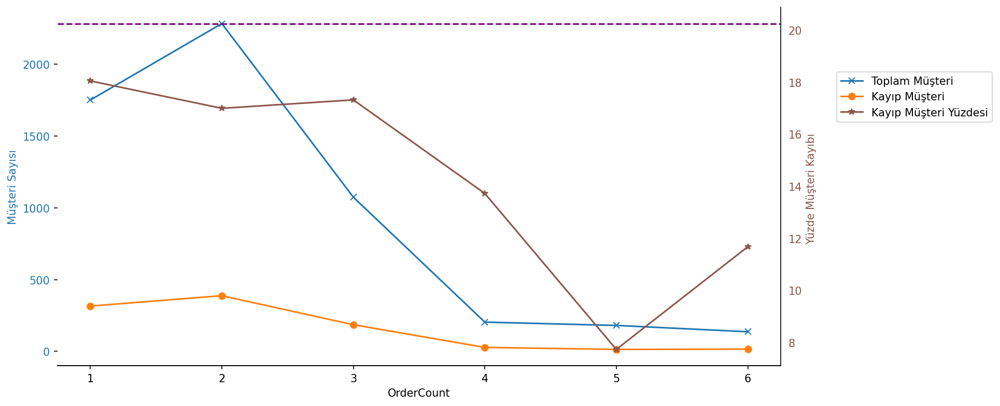

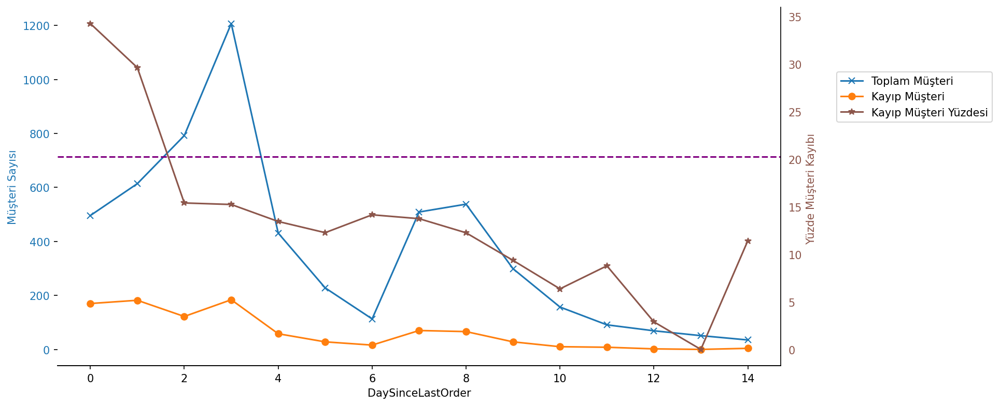

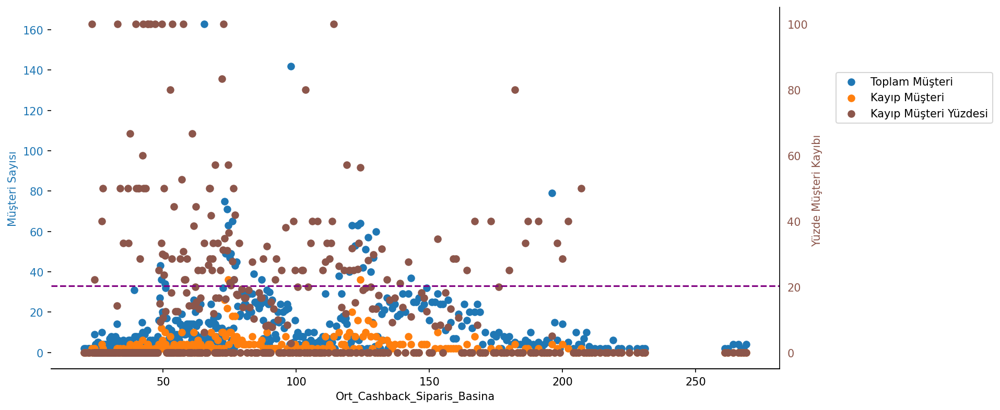

In [253]:
# Anlaşılabilir fakat biraz zorlama
graph_maker('Tenure')

graph_maker('CityTier')

graph_maker('WarehouseToHome')

graph_maker('PreferredPaymentMode')

graph_maker('Gender')

graph_maker('HourSpendOnApp')

graph_maker('NumberOfDeviceRegistered')

graph_maker('PreferedOrderCat')

graph_maker('SatisfactionScore')

graph_maker('MaritalStatus')

graph_maker('NumberOfAddress')

graph_maker('Complain')

graph_maker('OrderAmountHikeFromlastYear')

graph_maker('CouponUsed')

graph_maker('OrderCount')

graph_maker('DaySinceLastOrder')

scatter_maker('Ort_Cashback_Siparis_Basina')



C:\Users\oguzh\anaconda3\envs\test-env\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


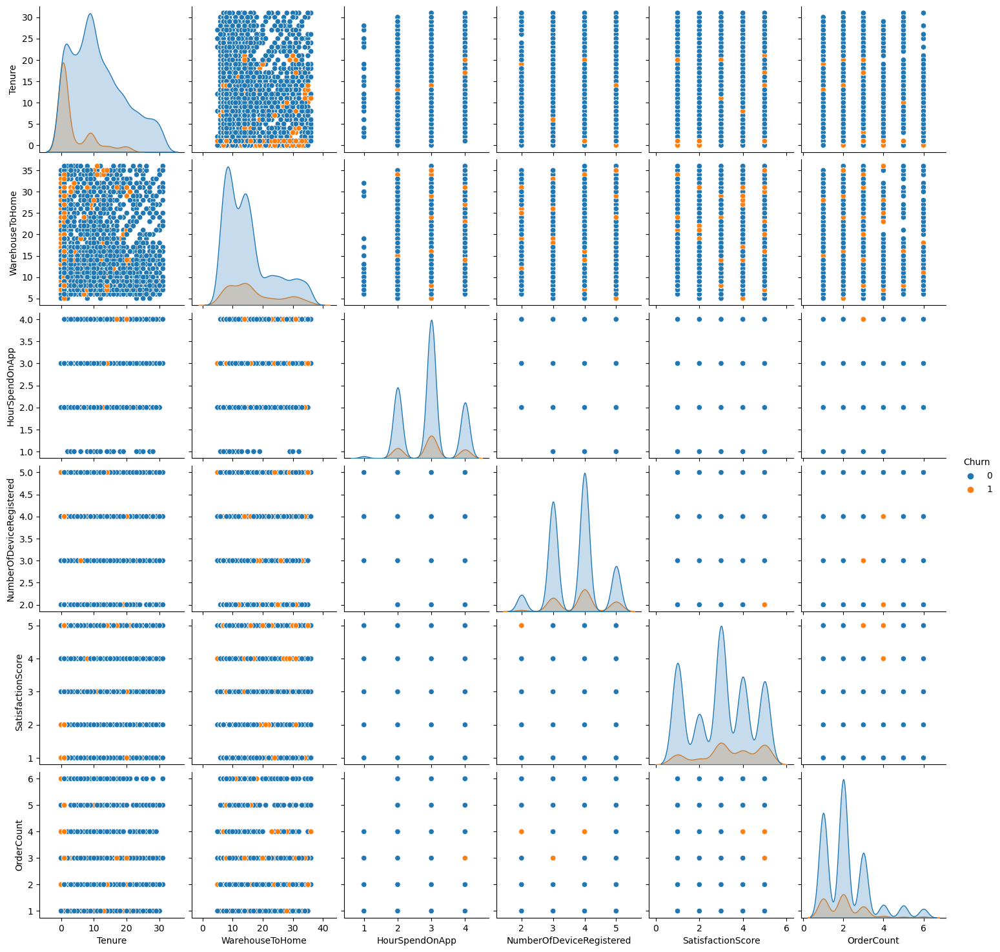

In [254]:
# Gereksiz
feature_say = ['Tenure', 'WarehouseToHome', 'HourSpendOnApp', 'NumberOfDeviceRegistered', 'SatisfactionScore', 'Churn', 'OrderCount']
sns.pairplot(df[feature_say], hue = 'Churn') 


C:\Users\oguzh\anaconda3\envs\test-env\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


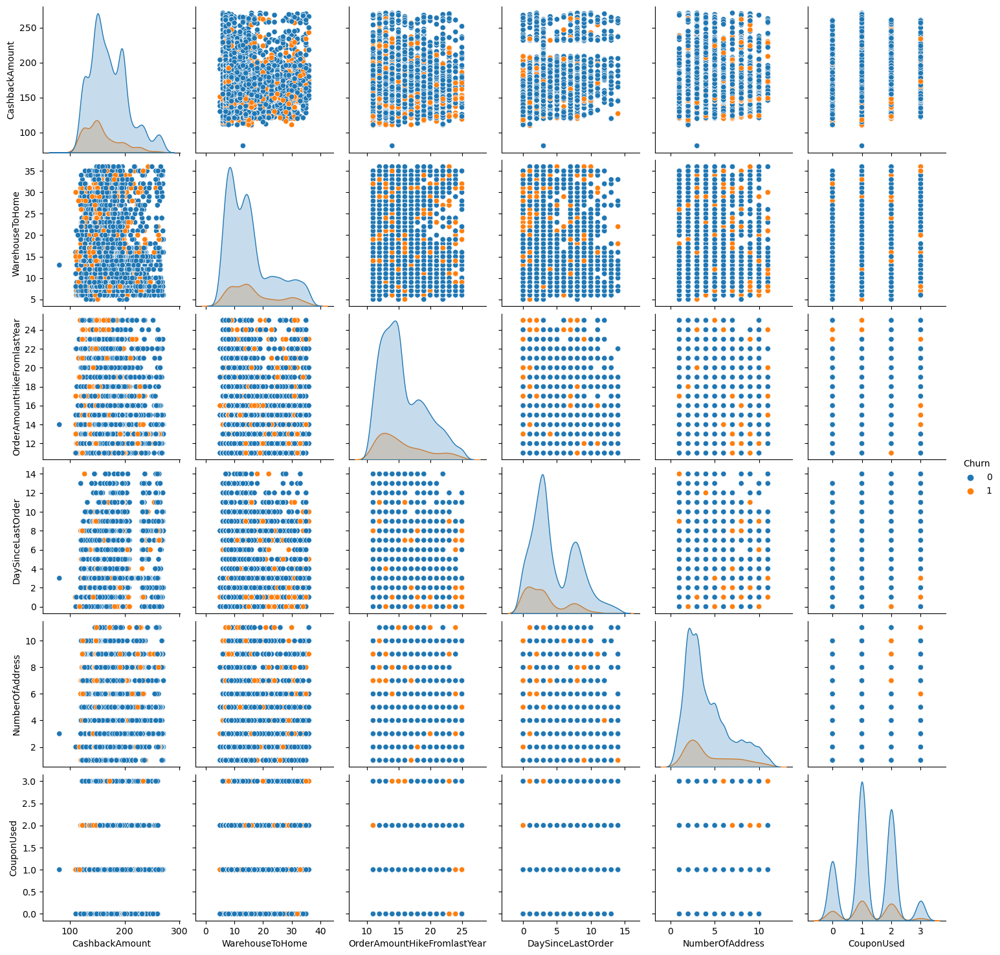

In [255]:
feature_say = ['CashbackAmount', 'WarehouseToHome', 'OrderAmountHikeFromlastYear', 'DaySinceLastOrder', 'NumberOfAddress', 'Churn', 'CouponUsed']
sns.pairplot(df[feature_say], hue = 'Churn') 

In [256]:
say_corr = sayisallar.copy()
say_corr.append('Churn')

<Axes: >

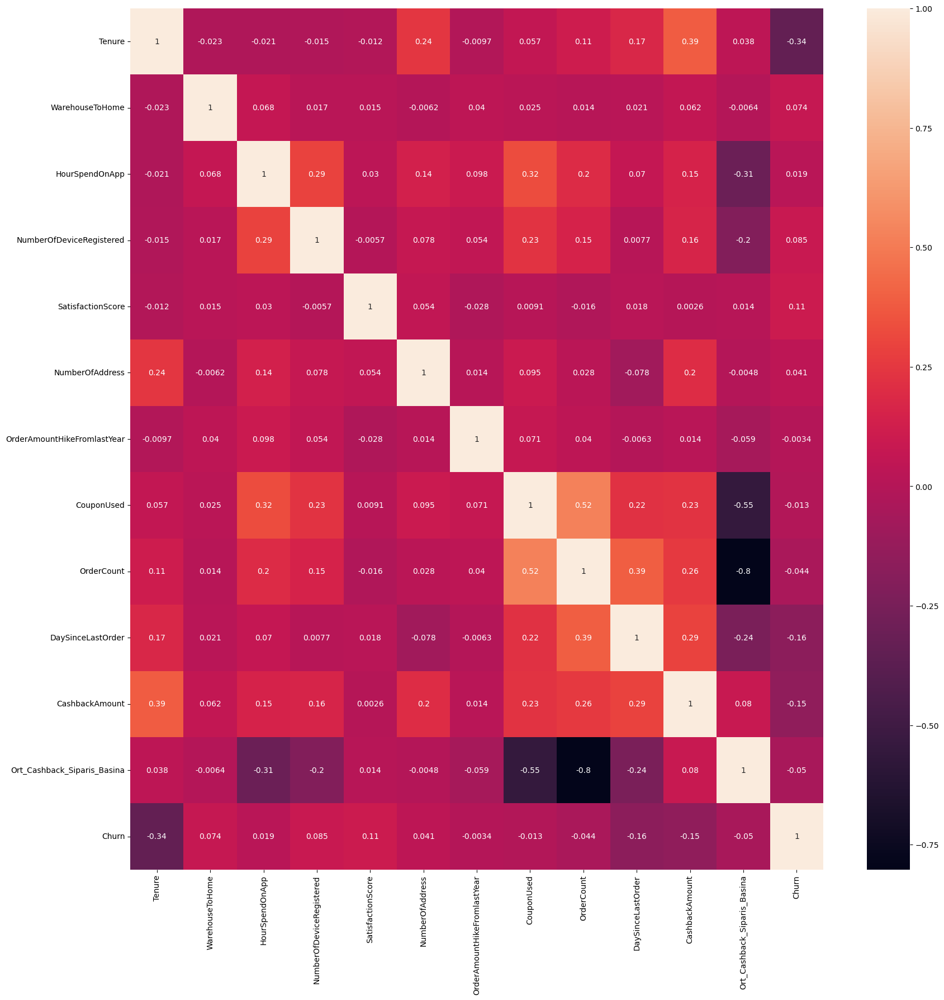

In [257]:
plt.figure(figsize = (20,20))
sns.heatmap(df[say_corr].corr(),annot = True)

## One Hot Encoding ile Kategorik Değişkenleri Dönüştürüp , Ölçeklendirme

### One Hot Encoding

In [258]:
df_dummy = df.copy()
df_dummy.head()

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,Ort_Cashback_Siparis_Basina
0,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,160,160.0
1,1,9.0,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,121,121.0
2,1,9.0,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120,120.0
3,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134,134.0
4,1,0.0,Phone,1,12.0,CC,Male,3.0,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,130,130.0


In [259]:
df_dummy = pd.get_dummies(df_dummy, drop_first = True, dtype = 'int64')   # drop_first=False özellik : k-1 , gender'da gender_male ve gender_female yerine birini tutar.

In [260]:
df_dummy.head()

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1
0,4.0,6.0,3.0,3,2,9,11.0,1.0,1.0,5.0,...,0,0,0,1,0,0,0,0,1,1
1,9.0,8.0,3.0,4,3,7,15.0,0.0,1.0,0.0,...,1,1,0,0,1,0,0,0,1,1
2,9.0,30.0,2.0,4,3,6,14.0,0.0,1.0,3.0,...,0,1,0,0,1,0,0,0,1,1
3,0.0,15.0,2.0,4,5,8,23.0,0.0,1.0,3.0,...,0,1,0,1,0,0,0,0,1,0
4,0.0,12.0,3.0,3,5,3,11.0,1.0,1.0,3.0,...,0,1,0,0,1,0,0,0,1,0


In [261]:
df_dummy.dtypes

Tenure                                   float64
WarehouseToHome                          float64
HourSpendOnApp                           float64
NumberOfDeviceRegistered                   int64
SatisfactionScore                          int64
NumberOfAddress                            int64
OrderAmountHikeFromlastYear              float64
CouponUsed                               float64
OrderCount                               float64
DaySinceLastOrder                        float64
CashbackAmount                             int64
Ort_Cashback_Siparis_Basina              float64
Churn_1                                    int64
PreferredLoginDevice_Mobile Phone          int64
PreferredLoginDevice_Phone                 int64
CityTier_2                                 int64
CityTier_3                                 int64
PreferredPaymentMode_COD                   int64
PreferredPaymentMode_Cash on Delivery      int64
PreferredPaymentMode_Credit Card           int64
PreferredPaymentMode

### Sayısal Özellikleri Ölçeklendirme

In [262]:
# Kategrorik değişkenleri dönüştürdük.Dönüşüm Değerleri 1 ve 0 olarak tutuluyor.Fakat diğer sayısal değişkenlerle arasında anlamsız fark oluştu.Bunu düzenlememiz lazım.
# Standard Scaler ı ve arka planını açıkla
from sklearn.preprocessing import StandardScaler

In [263]:
# scaler nesnesi oluşturalım standard scaler'dan
scaler = StandardScaler()

In [264]:
features = df_dummy[sayisallar]   #kategorikle 0 ve 1 arasında sayısallarda onlara göre ölçeklenmeli-standardscaler z-skor kullanır
features = scaler.fit_transform(features)   #sayısal özellikleri ölçekledik

In [265]:
features

array([[-0.73832634, -1.17941504,  0.09325492, ...,  0.19907374,
        -0.2769459 ,  1.42296582],
       [-0.13366901, -0.93187154,  0.09325492, ..., -1.32414611,
        -1.4062803 ,  0.53214448],
       [-0.13366901,  1.79110688, -1.33344405, ..., -0.4102142 ,
        -1.43523759,  0.50930291],
       ...,
       [-1.10112074, -0.5605563 ,  0.09325492, ..., -0.10557023,
         0.4759437 , -0.10741956],
       [ 1.55937153, -0.8080998 ,  1.5199539 , ...,  1.41764962,
         0.27324266, -0.18736507],
       [-0.25460048, -0.06546932,  0.09325492, ..., -0.4102142 ,
        -0.01633027, -0.30157293]])

In [266]:
scaled_df_dummy = df_dummy.copy()    #df_dummy den yeni kopya alıp scale edilmiş dataframe i oluşturalım

In [267]:
scaled_df_dummy[sayisallar] = features     #sayısal özelliklerin old. sutunlara ölçeklenmiş verileri yerleştirdik.

In [268]:
scaled_df_dummy.head(15)

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1
0,-0.738326,-1.179415,0.093255,-0.911765,-0.772992,1.883200,-1.319620,-0.330738,-1.003537,0.199074,...,0,0,0,1,0,0,0,0,1,1
1,-0.133669,-0.931872,0.093255,0.363573,-0.048392,1.097923,-0.178995,-1.543014,-1.003537,-1.324146,...,1,1,0,0,1,0,0,0,1,1
2,-0.133669,1.791107,-1.333444,0.363573,-0.048392,0.705285,-0.464151,-1.543014,-1.003537,-0.410214,...,0,1,0,0,1,0,0,0,1,1
3,-1.222052,-0.065469,-1.333444,0.363573,1.400807,1.490562,2.102255,-1.543014,-1.003537,-0.410214,...,0,1,0,1,0,0,0,0,1,0
4,-1.222052,-0.436785,0.093255,-0.911765,1.400807,-0.472631,-1.319620,-0.330738,-1.003537,-0.410214,...,0,1,0,0,1,0,0,0,1,0
5,-1.222052,0.800933,0.093255,1.638912,1.400807,-0.865269,1.817099,0.881538,3.374883,0.808362,...,0,0,0,0,0,1,0,0,1,1
6,-0.133669,-0.560556,-1.333444,-0.911765,-0.772992,-0.079992,-0.464151,-1.543014,-1.003537,-1.324146,...,0,1,0,1,0,0,0,0,0,0
7,-0.133669,-1.179415,0.093255,-0.911765,-0.772992,-0.472631,0.106161,0.881538,-0.127853,-1.324146,...,0,1,0,0,1,0,0,0,0,1
8,0.350057,-0.808100,0.093255,0.363573,-0.048392,-0.865269,-0.464151,-1.543014,-1.003537,-0.714858,...,0,1,0,0,1,0,0,0,0,1
9,-0.133669,1.914879,-1.333444,1.638912,-0.048392,-0.865269,-1.034464,-0.330738,-1.003537,-1.019502,...,0,1,0,0,1,0,0,0,1,0


### Hiyerarşik Kümeleme

In [269]:
scaled_df_dummy_h = scaled_df_dummy.copy()

In [270]:
baglanti_matrisi = linkage(scaled_df_dummy_h, method = 'average')   # linkage ile bağlantı matrisi oluşur.veri noktaları arasındaki mesafeyi hesaplar ve veri noktalarını birleştirme şeklini belirler


In [271]:
baglanti_matrisi

array([[1.00000000e+00, 1.34700000e+03, 0.00000000e+00, 2.00000000e+00],
       [2.00000000e+00, 1.35900000e+03, 0.00000000e+00, 2.00000000e+00],
       [1.10000000e+01, 1.39500000e+03, 0.00000000e+00, 2.00000000e+00],
       ...,
       [1.12510000e+04, 1.12550000e+04, 5.95566734e+00, 5.57200000e+03],
       [1.12520000e+04, 1.12560000e+04, 5.98510797e+00, 5.59200000e+03],
       [1.12400000e+04, 1.12570000e+04, 6.58303911e+00, 5.63000000e+03]])

In [272]:
churn_etiketleri = np.array(scaled_df_dummy_h.Churn_1)

### fcluster ile Küme Oluşturma

In [273]:
# criterion=maxclust,cluster=4 parametreler
# fcluster : bağlantı matrisini (link_method) kullanarak kümeleme sonuçlarını bulur.Bunun için bir benzerlik eşiği veya küme sayısı kullanılır.
# Burada küme sayısı kullandık.Yani kumeler çıktısı olarak her bir veri noktası için hangi kümede yer aldıklarını bir dizi içinde dönmesini bekleriz.

kumeler = fcluster(baglanti_matrisi, 4, criterion = 'maxclust')

In [274]:
kumeler

array([4, 4, 4, ..., 4, 4, 4], dtype=int32)

In [275]:
#verilerin küme değerlerini dataframe'e yeni bir sutun olarak ekleyelim
scaled_df_dummy_h['kumeler'] = kumeler

In [276]:
scaled_df_dummy_h.head()

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1,kumeler
0,-0.738326,-1.179415,0.093255,-0.911765,-0.772992,1.883200,-1.319620,-0.330738,-1.003537,0.199074,...,0,0,1,0,0,0,0,1,1,4
1,-0.133669,-0.931872,0.093255,0.363573,-0.048392,1.097923,-0.178995,-1.543014,-1.003537,-1.324146,...,1,0,0,1,0,0,0,1,1,4
2,-0.133669,1.791107,-1.333444,0.363573,-0.048392,0.705285,-0.464151,-1.543014,-1.003537,-0.410214,...,1,0,0,1,0,0,0,1,1,4
3,-1.222052,-0.065469,-1.333444,0.363573,1.400807,1.490562,2.102255,-1.543014,-1.003537,-0.410214,...,1,0,1,0,0,0,0,1,0,4
4,-1.222052,-0.436785,0.093255,-0.911765,1.400807,-0.472631,-1.319620,-0.330738,-1.003537,-0.410214,...,1,0,0,1,0,0,0,1,0,4


In [277]:
df_h = df.copy()     #orjinal veri setini bozmamak için kopya alalım

In [278]:
df_h['kumeler'] = kumeler   # burayada cluster_max verisini ekleyelim


In [279]:
df_h.head()

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,...,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,Ort_Cashback_Siparis_Basina,kumeler
0,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,...,Single,9,1,11.0,1.0,1.0,5.0,160,160.0,4
1,1,9.0,Phone,1,8.0,UPI,Male,3.0,4,Mobile,...,Single,7,1,15.0,0.0,1.0,0.0,121,121.0,4
2,1,9.0,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,...,Single,6,1,14.0,0.0,1.0,3.0,120,120.0,4
3,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,...,Single,8,0,23.0,0.0,1.0,3.0,134,134.0,4
4,1,0.0,Phone,1,12.0,CC,Male,3.0,3,Mobile,...,Single,3,0,11.0,1.0,1.0,3.0,130,130.0,4


### Kümeleri Anlayalım
- Kümeleri tanımplayıp aralarındaki farkları belirleyelim.Kümelerin hangi özelliklere göre oluştuğunu anlayalım

In [280]:
grup_median = scaled_df_dummy_h.iloc[:,:].groupby('kumeler').median()      # Veriyi kumelere gore gruplayıp her hücreye o grubun median değerini yazıyoruz
grup_median['freq'] = scaled_df_dummy_h.kumeler.value_counts().sort_index()
grup_median


,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1,freq
kumeler,,,,,,,,,,,,,,,,,,,,,
1,0.954714,1.296020,0.093255,-0.911765,0.676207,-0.079992,-0.178995,-0.330738,-1.003537,-0.410214,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,38
2,1.498906,-0.622442,0.093255,0.363573,-0.772992,1.883200,2.244833,-0.330738,-1.003537,-1.019502,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,20
3,0.833783,1.791107,0.093255,0.363573,-0.048392,-0.079992,-0.464151,-0.330738,-0.127853,0.503718,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,213
4,-0.133669,-0.189241,0.093255,0.363573,-0.048392,-0.472631,-0.178995,-0.330738,-0.127853,-0.410214,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,5359


In [281]:
df_h[sayisallar] = df_h[sayisallar].astype('float64')
df_h.dtypes

Churn                           object
Tenure                         float64
PreferredLoginDevice            object
CityTier                        object
WarehouseToHome                float64
PreferredPaymentMode            object
Gender                          object
HourSpendOnApp                 float64
NumberOfDeviceRegistered       float64
PreferedOrderCat                object
SatisfactionScore              float64
MaritalStatus                   object
NumberOfAddress                float64
Complain                        object
OrderAmountHikeFromlastYear    float64
CouponUsed                     float64
OrderCount                     float64
DaySinceLastOrder              float64
CashbackAmount                 float64
Ort_Cashback_Siparis_Basina    float64
kumeler                          int32
dtype: object

In [282]:
say_kumeli=sayisallar.copy()
say_kumeli.append('kumeler')

In [283]:
grup_mean=df_h[say_kumeli].groupby('kumeler').mean()   # Kumeler sutununa göre gruplayıp her hücreye o grubun ortalamasını koyar.
grup_mean['freq']=df_h.kumeler.value_counts().sort_index()
grup_mean

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,Ort_Cashback_Siparis_Basina,freq
kumeler,,,,,,,,,,,,,
1,16.315789,22.026316,2.473684,3.394737,3.578947,3.684211,15.947368,0.789474,1.000000,3.421053,238.736842,238.736842,38
2,20.050000,12.150000,2.850000,3.850000,1.950000,7.700000,23.050000,1.150000,1.450000,1.700000,156.750000,119.650000,20
3,16.530516,28.286385,2.924883,3.563380,3.098592,4.286385,15.136150,1.361502,2.582160,5.901408,227.699531,97.765571,213
4,9.768800,14.988431,2.938608,3.722709,3.066057,4.191080,15.617279,1.273185,2.139392,4.301176,166.810599,96.618352,5359


### Kmeans Kümeleme 

In [284]:
scaled_df_dummy_k = scaled_df_dummy.copy()    # Kmeans kümeleme için üzerinde işlem yapacağımız veriyi aldık

In [285]:
# 2 den 20 ye kadar küme olan değerlerde farklı küme sayılarına veriyi ayırırız
# En uygun küme sayısını bulmak için toplam hata kareleri(ağırlıklı kareler toplamı) 
# (en yakın küme merkezine olan uzaklıların karelerinin toplamı) akt içinde tutulur.
akt = []
etiketler = []
for i in range(2,20):
    k_means = KMeans(n_clusters = i, n_init = 10)
    k_means.fit(scaled_df_dummy_k)
    etiketler.append(k_means.labels_)
    akt.append(k_means.inertia_)

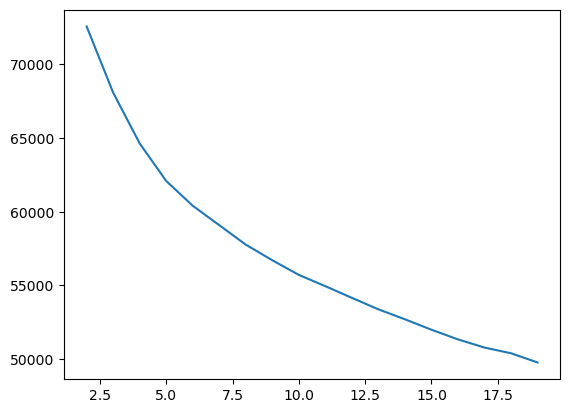

In [286]:
plt.plot(np.arange(2,20),akt)     # Güzel bir dirsek yakalayamıyoruz.Sonuç yaklaşık miktarlarda azalma yapıyor.Fakat en büyük farkı baz alırsak 4 olarak alabiliriz.

In [287]:
akt

[72575.38631594833,
 68082.06227967449,
 64635.03580529663,
 62086.195921922896,
 60403.272807970934,
 59084.96263654461,
 57763.69658783544,
 56703.74564043785,
 55708.94136747571,
 54941.46580694071,
 54152.566250991964,
 53369.79600843104,
 52695.371930106325,
 51986.91102059464,
 51330.562016772186,
 50775.180087661014,
 50388.95604242613,
 49763.138538305706]

In [288]:
etiketler

[array([1, 1, 1, ..., 1, 0, 0]),
 array([1, 1, 1, ..., 1, 2, 0]),
 array([3, 3, 3, ..., 3, 2, 0]),
 array([0, 1, 1, ..., 1, 2, 4]),
 array([3, 1, 1, ..., 1, 0, 4]),
 array([1, 5, 5, ..., 6, 3, 2]),
 array([6, 3, 3, ..., 2, 5, 2]),
 array([4, 1, 1, ..., 0, 7, 0]),
 array([6, 6, 3, ..., 7, 0, 7]),
 array([0, 0, 6, ..., 5, 3, 5]),
 array([4, 6, 6, ..., 0, 3, 0]),
 array([ 3,  3,  2, ..., 10,  1, 10]),
 array([ 8,  8, 11, ..., 10,  0, 10]),
 array([6, 6, 3, ..., 8, 0, 8]),
 array([ 7,  7,  5, ..., 11, 12, 11]),
 array([ 1,  1,  0, ..., 10, 15, 10]),
 array([ 4,  0, 11, ...,  8, 16,  8]),
 array([10, 10, 15, ...,  2,  0,  2])]

In [289]:
# silhoette scoru ile kümelerin ne kadar iyi ayrıldığını ölçelim
silhoutte_s = []
for i in etiketler:
    skor = silhouette_score(scaled_df_dummy_k, i)
    silhoutte_s.append(skor)

In [290]:
silhoutte_s   # Bu skora göre küme sayısı 2 olmalı  .1 e en yakın değer en iyidir.Fakat hepsi çok uzak.Doğru sonuç vereceğini düşünmüyorum.

[0.13800430399839386,
 0.1067326996079956,
 0.10130236815727131,
 0.08705480962684012,
 0.08332837021138435,
 0.07818027776847802,
 0.08203108046178709,
 0.07491450215037723,
 0.07276766018503779,
 0.07730078190823997,
 0.0686567189702843,
 0.06163198795364177,
 0.06880633741875403,
 0.06378063981927846,
 0.06356936293374413,
 0.0679842186635538,
 0.05843567328808746,
 0.0673427797889]

In [291]:
# Küme sayısını 4 olarak aldık 
k_means = KMeans(n_clusters = 4, n_init = 10)
k_means.fit(scaled_df_dummy_k)
etiketler = k_means.labels_

In [292]:
scaled_df_dummy_k['kmeans_kumeler'] = etiketler
scaled_df_dummy_k.head(10)

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1,kmeans_kumeler
0,-0.738326,-1.179415,0.093255,-0.911765,-0.772992,1.883200,-1.319620,-0.330738,-1.003537,0.199074,...,0,0,1,0,0,0,0,1,1,3
1,-0.133669,-0.931872,0.093255,0.363573,-0.048392,1.097923,-0.178995,-1.543014,-1.003537,-1.324146,...,1,0,0,1,0,0,0,1,1,3
2,-0.133669,1.791107,-1.333444,0.363573,-0.048392,0.705285,-0.464151,-1.543014,-1.003537,-0.410214,...,1,0,0,1,0,0,0,1,1,3
3,-1.222052,-0.065469,-1.333444,0.363573,1.400807,1.490562,2.102255,-1.543014,-1.003537,-0.410214,...,1,0,1,0,0,0,0,1,0,3
4,-1.222052,-0.436785,0.093255,-0.911765,1.400807,-0.472631,-1.319620,-0.330738,-1.003537,-0.410214,...,1,0,0,1,0,0,0,1,0,3
5,-1.222052,0.800933,0.093255,1.638912,1.400807,-0.865269,1.817099,0.881538,3.374883,0.808362,...,0,0,0,0,1,0,0,1,1,0
6,-0.133669,-0.560556,-1.333444,-0.911765,-0.772992,-0.079992,-0.464151,-1.543014,-1.003537,-1.324146,...,1,0,1,0,0,0,0,0,0,3
7,-0.133669,-1.179415,0.093255,-0.911765,-0.772992,-0.472631,0.106161,0.881538,-0.127853,-1.324146,...,1,0,0,1,0,0,0,0,1,1
8,0.350057,-0.808100,0.093255,0.363573,-0.048392,-0.865269,-0.464151,-1.543014,-1.003537,-0.714858,...,1,0,0,1,0,0,0,0,1,3
9,-0.133669,1.914879,-1.333444,1.638912,-0.048392,-0.865269,-1.034464,-0.330738,-1.003537,-1.019502,...,1,0,0,1,0,0,0,1,0,3


In [293]:
grup_median_kmeans = scaled_df_dummy_k.iloc[:,:].groupby('kmeans_kumeler').mean()
grup_median_kmeans['freq'] = scaled_df_dummy_k.kmeans_kumeler.value_counts().sort_index()
grup_median_kmeans

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1,freq
kmeans_kumeler,,,,,,,,,,,,,,,,,,,,,
0,0.020678,-0.029140,-0.191218,-0.305076,-0.107065,-0.380432,-0.017657,0.709758,1.443592,0.984426,...,0.591093,0.043522,0.487854,0.084008,0.126518,0.076923,0.578947,0.264170,0.243927,988
1,-0.555369,0.050472,0.682163,0.600153,0.013029,0.026850,0.141193,0.405712,0.061484,-0.302990,...,0.620393,0.003686,0.352580,0.035012,0.542998,0.001843,0.493243,0.364865,0.304668,1628
2,1.119324,0.076184,0.280750,0.233709,0.068906,0.642066,0.020788,0.285423,0.162517,0.318121,...,0.558747,0.288077,0.227154,0.000870,0.048738,0.126197,0.570061,0.261967,0.299391,1149
3,-0.215760,-0.075557,-0.667141,-0.506255,0.002893,-0.217468,-0.126704,-0.906000,-0.918551,-0.453011,...,0.615550,0.016086,0.393029,0.358177,0.110456,0.021448,0.512601,0.343164,0.280429,1865


In [294]:
df_kmeans = df.copy()

In [295]:
df_kmeans['kmeans_kumeler'] = scaled_df_dummy_k['kmeans_kumeler'] 

In [296]:
grup_mean_kmeans = df_kmeans.select_dtypes(exclude = ['object']).groupby('kmeans_kumeler').mean()
grup_mean_kmeans['freq'] = df_kmeans.kmeans_kumeler.value_counts().sort_index()
grup_mean_kmeans

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,Ort_Cashback_Siparis_Basina,freq
kmeans_kumeler,,,,,,,,,,,,,
0,10.276316,15.293522,2.800607,3.475709,2.919028,3.234818,15.565789,1.858300,3.794534,7.577935,170.301619,49.005719,988
1,5.512899,15.936732,3.412776,4.185504,3.084767,4.272113,16.122850,1.607494,2.216216,3.351966,164.150491,76.508190,1628
2,19.361184,16.144473,3.131419,3.898172,3.161880,5.838990,15.700609,1.508268,2.331593,5.390775,210.868581,98.476936,1149
3,8.321180,14.918499,2.467024,3.317962,3.070777,3.649866,15.183378,0.525469,1.097051,2.859517,148.451475,141.524844,1865


### Sınıflandırma Modellerini Oluşturma

In [297]:
scaled_df_dummy_h.head()
scaled_df_dummy_h.dtypes

Tenure                                   float64
WarehouseToHome                          float64
HourSpendOnApp                           float64
NumberOfDeviceRegistered                 float64
SatisfactionScore                        float64
NumberOfAddress                          float64
OrderAmountHikeFromlastYear              float64
CouponUsed                               float64
OrderCount                               float64
DaySinceLastOrder                        float64
CashbackAmount                           float64
Ort_Cashback_Siparis_Basina              float64
Churn_1                                    int64
PreferredLoginDevice_Mobile Phone          int64
PreferredLoginDevice_Phone                 int64
CityTier_2                                 int64
CityTier_3                                 int64
PreferredPaymentMode_COD                   int64
PreferredPaymentMode_Cash on Delivery      int64
PreferredPaymentMode_Credit Card           int64
PreferredPaymentMode

In [298]:
scaled_df_dummy_h['kumeler'] = scaled_df_dummy_h['kumeler'].astype('object')   # Kumeler int32 tipinde fakat kategorik bir değişken old. için uygun veri tipine dönüştürelim

In [299]:
scaled_df_dummy_h.head()

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1,kumeler
0,-0.738326,-1.179415,0.093255,-0.911765,-0.772992,1.883200,-1.319620,-0.330738,-1.003537,0.199074,...,0,0,1,0,0,0,0,1,1,4
1,-0.133669,-0.931872,0.093255,0.363573,-0.048392,1.097923,-0.178995,-1.543014,-1.003537,-1.324146,...,1,0,0,1,0,0,0,1,1,4
2,-0.133669,1.791107,-1.333444,0.363573,-0.048392,0.705285,-0.464151,-1.543014,-1.003537,-0.410214,...,1,0,0,1,0,0,0,1,1,4
3,-1.222052,-0.065469,-1.333444,0.363573,1.400807,1.490562,2.102255,-1.543014,-1.003537,-0.410214,...,1,0,1,0,0,0,0,1,0,4
4,-1.222052,-0.436785,0.093255,-0.911765,1.400807,-0.472631,-1.319620,-0.330738,-1.003537,-0.410214,...,1,0,0,1,0,0,0,1,0,4


In [300]:
scaled_h = pd.get_dummies(scaled_df_dummy_h, drop_first = True, dtype = 'float64')   # Yeni kategorik değişkenimize dummy dönüşümü yapalım


In [301]:
scaled_h.head()

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1,kumeler_2,kumeler_3,kumeler_4
0,-0.738326,-1.179415,0.093255,-0.911765,-0.772992,1.883200,-1.319620,-0.330738,-1.003537,0.199074,...,1,0,0,0,0,1,1,0.0,0.0,1.0
1,-0.133669,-0.931872,0.093255,0.363573,-0.048392,1.097923,-0.178995,-1.543014,-1.003537,-1.324146,...,0,1,0,0,0,1,1,0.0,0.0,1.0
2,-0.133669,1.791107,-1.333444,0.363573,-0.048392,0.705285,-0.464151,-1.543014,-1.003537,-0.410214,...,0,1,0,0,0,1,1,0.0,0.0,1.0
3,-1.222052,-0.065469,-1.333444,0.363573,1.400807,1.490562,2.102255,-1.543014,-1.003537,-0.410214,...,1,0,0,0,0,1,0,0.0,0.0,1.0
4,-1.222052,-0.436785,0.093255,-0.911765,1.400807,-0.472631,-1.319620,-0.330738,-1.003537,-0.410214,...,0,1,0,0,0,1,0,0.0,0.0,1.0


### SMOTE Kullanarak Verideki Olası Dengesizlikleri Düzenleme ve Yeniden Örnekleme

In [302]:
X1 = scaled_h.drop(['Churn_1'], axis = 1)   # Eğitim özelliklerimiz
y1 = scaled_h['Churn_1']                    # Hedef değişkenimiz

In [303]:
from imblearn.over_sampling import SMOTE     # Veri setindeki dengesizlikleri çözelim.Azınlık grupların görmezden gelinme ihtimalini azaltalım.
smt = SMOTE(random_state = 33)
X_res, y_res = smt.fit_resample(X1, y1.ravel())    # Yeniden örnekleme

In [304]:
y_res = pd.DataFrame(y_res)
y_res.columns = ['Churn_1']

In [305]:
scaled_h_smt=pd.concat([X_res,y_res],axis = 1)   # Yeniden örnekleme yaptığımız özelliklerimizi ve hedef değişkeni tekrar birleştirip veri setimizi model için uygun hale getirelim

### Train Test Split

In [306]:
from sklearn.model_selection import train_test_split

In [307]:
X = scaled_h_smt.drop(['Churn_1'],axis = 1)   
y = scaled_h_smt['Churn_1']
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.75,random_state = 42)   # Modeli eğiteceğimiz veriyi ve test edeceğimiz veriyi ayıralım

In [308]:
scaled_h_smt.head()

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1,kumeler_2,kumeler_3,kumeler_4,Churn_1
0,-0.738326,-1.179415,0.093255,-0.911765,-0.772992,1.883200,-1.319620,-0.330738,-1.003537,0.199074,...,0,0,0,0,1,1,0.0,0.0,1.0,1
1,-0.133669,-0.931872,0.093255,0.363573,-0.048392,1.097923,-0.178995,-1.543014,-1.003537,-1.324146,...,1,0,0,0,1,1,0.0,0.0,1.0,1
2,-0.133669,1.791107,-1.333444,0.363573,-0.048392,0.705285,-0.464151,-1.543014,-1.003537,-0.410214,...,1,0,0,0,1,1,0.0,0.0,1.0,1
3,-1.222052,-0.065469,-1.333444,0.363573,1.400807,1.490562,2.102255,-1.543014,-1.003537,-0.410214,...,0,0,0,0,1,0,0.0,0.0,1.0,1
4,-1.222052,-0.436785,0.093255,-0.911765,1.400807,-0.472631,-1.319620,-0.330738,-1.003537,-0.410214,...,1,0,0,0,1,0,0.0,0.0,1.0,1


### Logistic Regression 
- Problemimiz bir sınıflandırma problemi olduğu için logistic regresyon da sınıflandırma için kullanılan popüler bir algoritma olduğu için modelimizi eğitip sonuçları değerlendiricez.

### Model Eğitimi

In [309]:
log_reg = LogisticRegression(max_iter = 1000)  # Model nesnesi oluşturduk.İterasyon yakınsayamadığı için max_iter=1000 girdik
log_reg.fit(X_train, y_train)                   # Modeli fit ediyoruz.

LogisticRegression(max_iter=1000)

### Test ve Train Üzerinde Tahmin

In [310]:
y_train_pred = log_reg.predict(X_train)   # Eğittiğimiz modeli kullanrak eğitim seti üzerinde tahmin yapıyoruz
y_test_pred = log_reg.predict(X_test)     # Aynı şekilde test verisi üzerindede tahminlerimizi yapıyoruz.

### Sınıf Olasılıkları

In [311]:
# Tahminlerin yanı sıra sınıf olasılıklarını (sınıf için tahmin edilen olasılıklar) da döndürür.
# Çıktı olarak her bir sınıfın olasılıklarını içeren bir dizi alırız.
# Neden sınıf olasılıklarını alırız ? Neyi yorumlarız? Ne amaçla kullanırız?
# Sınıf 1 için olan değerleri seçiyoruz.Sınıf 0 Sınıf 1'in genelde tamamlayıcısıdır.
# ROC eğrisi çizerken eşik değer kullanıcaz.Sınıf 1 değerlerini 0.5 üstü pozitif ,altına negatif dicez.
train_probs = log_reg.predict_proba(X_train)[0:,1]   
test_probs  = log_reg.predict_proba(X_test)[0:,1]   

### Model Doğruluğu

In [312]:
# Model Doğruluğu : Eğitim verisi üzerinde doğru sınıflandırılan örneklerin yüzdesini verir.
log_reg.score(X_train, y_train)

0.837391428164602

In [313]:
# Model Doğruluğu : Test verisi üzerinde doğru sınıflandırılan örneklerin yüzdesini verir.
log_reg.score(X_test, y_test)

0.8316958564715934

### AUC Skoru ve ROC Eğrisi (Eğitim Verisi)

AUC Değeri :  0.919 


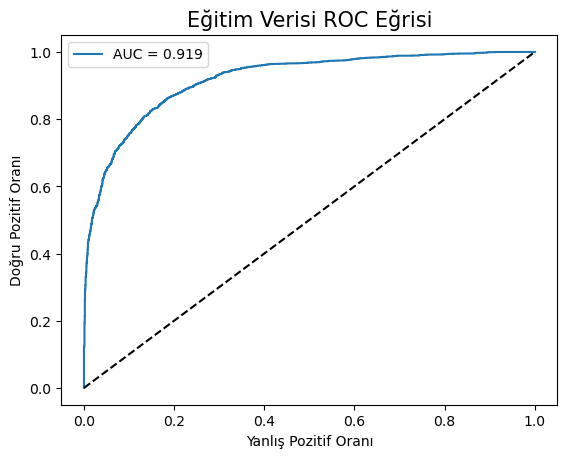

In [314]:
# AUC Değerini Hesaplayalım . ROC Eğrisi altında kalan alanı hesaplayarak sınflandırma performansını ölçeriz.
# AUC Değerinin 1'e yakın olması model performansına iyi diyebiliriz. 0.5'e yakınsa etkisiz bir model yapmışızdır.0.5 altı malum durum.
# TPR VE FPR değerlerini farklı eşik değerlerine göre hesaplar.ROC altında kalan alanı TPR ve FPR yi kullanarak hesaplar.
# ROC Eğrisi sol üst köşeye bükeyleştikçe perfomans artar.Zaten alttaki alanda artıyor 
AUC=roc_auc_score(y_train,train_probs)
print(f'AUC Değeri : {AUC : .3f} ')

# ROC Eğrisini Oluşturalım
# roc_curve(y_train = Gerçek etiketlerimiz ve train_probs = Sınıf olaslılıklarını alarak True Positive Rate,False Positive Rate ve Threshold değerlerini hesaplar.)
# train_fpr ve train_tpr farklı threshold değerlerindeki tpr ve fpr değerlerini içerir.

train_fpr,train_tpr,train_thr=roc_curve(y_train,train_probs)

plt.plot(train_fpr, train_tpr, label='AUC = %0.3f' %AUC)     # Ondalık 3 basamak AUC değerini sol üste yazar. 
plt.plot(train_fpr, train_fpr, linestyle = '--', color='k')  # Eğrinin bir ucundan diğer ucuna kesikli çizgi çeker.
plt.xlabel('Yanlış Pozitif Oranı')                           # X ekseni isimlendirmesi
plt.ylabel('Doğru Pozitif Oranı')                            # Y ekseni isimlendirmesi
plt.title('Eğitim Verisi ROC Eğrisi', size = 15)             # Grafik başlığı
plt.legend()                                                 # Legendları göster

### AUC Skoru ve ROC Eğrisi (Test Verisi)

AUC Değeri :  0.906 


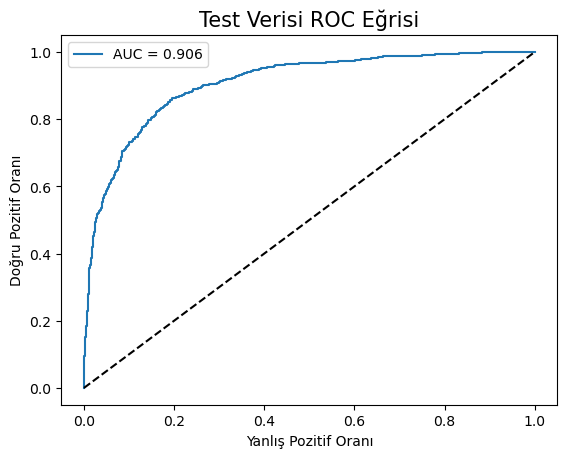

In [315]:
# Eğitim verisi için yaptığımız açıklamalar burada da geçerlidir.

AUC=roc_auc_score(y_test,test_probs)
print(f'AUC Değeri : {AUC : .3f} ')

test_fpr,test_tpr,test_thr=roc_curve(y_test,test_probs)

plt.plot(test_fpr, test_tpr, label='AUC = %0.3f' %AUC)       # Ondalık 3 basamak AUC değerini sol üste yazar. 
plt.plot(test_fpr, test_fpr, linestyle = '--', color='k')    # Eğrinin bir ucundan diğer ucuna kesikli çizgi çeker.(Random Classifier Çizgisi diyelim.)
plt.xlabel('Yanlış Pozitif Oranı')                           # X ekseni isimlendirmesi
plt.ylabel('Doğru Pozitif Oranı')                            # Y ekseni isimlendirmesi
plt.title('Test Verisi ROC Eğrisi', size = 15)               # Grafik başlığı
plt.legend()                                                 # Legendları göster

### Confusion Matrix (Karışıklık Matrisi) - Eğitim Verisi

Text(0.5, 1.0, 'Logistic Regresyon Modelinin Doğruluk Oranı (Eğitim) : 0.837391428164602')

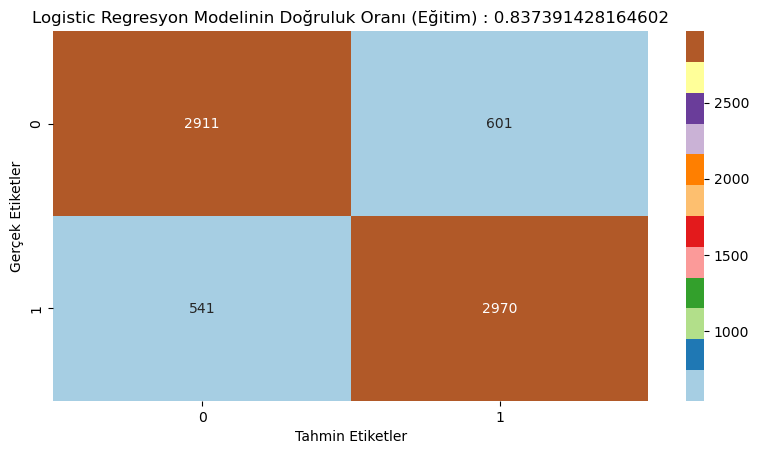

In [316]:
# Eğitim verisi için karışıklık matrisini hesaplayalım.Hata matriside denilebilir.
# Sınıflandırma problemlerinde model performansını gösterir.Yapılan hatalar hakkında bize fikir verir.
# Sınıflandırıcının hangi sınıfları ne kadar doğru tahmin ettiğini ve yaptığı  hataları görebiliriz.
# Hata matrisi kullanılarak :
# [Doğruluk (Accuracy)    : (TP + TN) / (TP + TN + FP + FN)]   # Doğru tahminlerin tüm veri setine oranı 
# [Hassasiyet (Precision) : TP / (TP + FP)]                    # Doğru pozitif tahminlerin toplam pozitif tahminlere oranı / Pozitif tahminlerin başarı oranı
# [Specificity (Özgüllük) : TN / (TN + FP)]                    # Doğru negatifin doğru negatif ve yanlış pozitife oranı
# [Duyarlılık (Recall)    : TP / (TP + FN)]                    # Doğru pozitiflerin doğru negatif ve pozitiflere oranı / Pozitif sınıfın doğru tahmin edilme oranı diyebiliriz.
# [F1 Skoru               : 2 * (Hassasiyet x Duyarlılık) / (Hassasiyet + Duyarlılık)]  # Perfomans metriği

log_reg_cfm_tr=confusion_matrix(y_train,y_train_pred)             # Gerçek etiketleri ve tahmin etiketlerini alır.
plt.figure(figsize=plt.figaspect(0.5))
sns.heatmap(data = log_reg_cfm_tr, annot = True, fmt = 'd',cmap = 'Paired')
plt.ylabel('Gerçek Etiketler')
plt.xlabel('Tahmin Etiketler')
title = f'Logistic Regresyon Modelinin Doğruluk Oranı (Eğitim) : {log_reg.score(X_train, y_train)}'
plt.title(title)

### Test Verisi

Text(0.5, 1.0, 'Logistic Regresyon Modelinin Doğruluk Oranı (Test) : 0.8316958564715934')

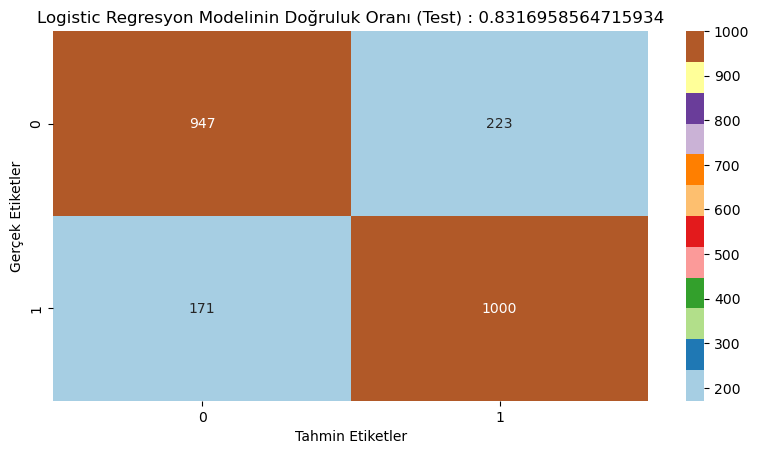

In [317]:
# Eğitim verisi için yapılan açıklamalar geçerlidir.

log_reg_cfm_tst = confusion_matrix(y_test,y_test_pred)  

plt.figure(figsize=plt.figaspect(0.5))
sns.heatmap(data = log_reg_cfm_tst, annot = True, fmt = 'd', cmap = 'Paired')
plt.ylabel('Gerçek Etiketler')
plt.xlabel('Tahmin Etiketler')
title = f'Logistic Regresyon Modelinin Doğruluk Oranı (Test) : {log_reg.score(X_test, y_test)}'
plt.title(title)

### Değerlendirme Metrikleri

In [325]:
# F1 skoru sonıf başına hesaplanır.Genel bir F1 skoru için bir şekilde birleştirmemiz gerekir.
# average = 'micro' : F1 skoru ile formulü aynıdır. Fakat [TP / (TP + 0.5 x (FP + FN))] : TP,FP ve FN'ler tüm sınıflar için toplam değerlerdir.
# average = 'macro' : Sınıf başına hesapladığımız F1 skorlarının ağırlıklandırılmamış ortalaması.Yani F1'leri topla ve sınıf saysıına böl. 
# micro : her gözleme eşit önem verirken. macro : her sınıfa eşit önem verir. 
# Eğer veri seti dengesizse micro kötü sonuç verir.Azınlık sınıfların performansı gizlenir.Çoğunluklarınki güçlenir.
# Biz micro seçicez.Çünkü sınıf dengesizliğimiz yok.Diğer skorlar içinde aynı şekilde micro seçicez.
# log loss : Başarı ve Optimizasyon için değerlendirdiğimiz bir metriktir.Tahmin edilenin gerçekten sapmasını ölçen metrik.Düşük olması iyidir.
# Jaccard Benzerliği : İki kümenin birbirine ne kadar benzediğinin bir ölçüsüdür.Basit tabirle (kesişim eleman sayısı / birleşim eleman sayısı)'dır.
def model_deg(model):
    model_adi = model.__class__.__name__
    # Tahminler
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Eğitim Verisi için
    f1_skoru = f1_score(y_train, y_train_pred, average = 'micro')
    hassasiyet = precision_score(y_train,y_train_pred,average = 'micro')
    duyarlilik = recall_score(y_train,y_train_pred,average = 'micro')
    jac_skoru = jaccard_score(y_train,y_train_pred,average = 'micro')
    log_kaybi = log_loss(y_train, y_train_pred)
    
    # Test Verisi için
    
    f1_skoru_test = f1_score(y_test, y_test_pred, average = 'micro')
    hassasiyet_test = precision_score(y_test, y_test_pred, average = 'micro')
    duyarlilik_test = recall_score(y_test, y_test_pred, average = 'micro')
    jac_skoru_test = jaccard_score(y_test, y_test_pred, average = 'micro')
    log_kaybi_test = log_loss(y_test, y_test_pred)

    #Eğitim
    print(f'Model İsmi :  {model_adi} \n')
    print(f'Eğitim Verisi için Doğruluk Skoru :  {model.score(X_train, y_train)} \n')
    print(f'Eğitim Verisi için F-1 Skoru :  {f1_skoru } \n ')
    print(f'Eğitim Verisi için Hassasiyet Skoru :  {hassasiyet} \n')
    print(f'Eğitim Verisi için Duyarlılık Skoru : {duyarlilik} \n')
    print(f'Eğitim Verisi için Jaccardi Skoru :  {jac_skoru} \n')
    print(f'Eğitim Verisi için Log-Loss Skoru :  {log_kaybi} \n')
    
    #Test
    print(f'Model İsmi :  {model_adi}\n')
    print(f'Test Verisi için Doğruluk Skoru :  {model.score(X_test, y_test)} \n')
    print(f'Test Verisi için F-1 Skoru :  {f1_skoru_test} \n')
    print(f'Test Verisi için Hassasiyet Skoru :  {hassasiyet_test} \n')
    print(f'Test Verisi için Duyarlılık Skoru :  {duyarlilik_test} \n')
    print(f'Test Verisi için Jaccardi Skoru : {jac_skoru_test} \n ')
    print(f'Test Verisi için Log-Loss Skoru : {log_kaybi_test} \n')

In [326]:
model_deg(log_reg)

Model İsmi :  LogisticRegression 

Eğitim Verisi için Doğruluk Skoru :  0.837391428164602 

Eğitim Verisi için F-1 Skoru :  0.837391428164602 
 
Eğitim Verisi için Hassasiyet Skoru :  0.837391428164602 

Eğitim Verisi için Duyarlılık Skoru : 0.837391428164602 

Eğitim Verisi için Jaccardi Skoru :  0.720269442743417 

Eğitim Verisi için Log-Loss Skoru :  5.861007001334442 

Model İsmi :  LogisticRegression

Test Verisi için Doğruluk Skoru :  0.8316958564715934 

Test Verisi için F-1 Skoru :  0.8316958564715934 

Test Verisi için Hassasiyet Skoru :  0.8316958564715934 

Test Verisi için Duyarlılık Skoru :  0.8316958564715934 

Test Verisi için Jaccardi Skoru : 0.7118829981718464 
 
Test Verisi için Log-Loss Skoru : 6.066296213290115 



### Modellerin Eğitimi
- Support Vector Machine (SVM)
- Decision Tree
- Random Forest
- KNN Model
- XGBoost

### Çapraz Doğrulama

In [327]:
def cros_val(model):
    
    val_skor = cross_val_score(model, X, y, cv=5, scoring='accuracy')
    ort_skor = val_skor.mean()
    print(f' \n Çapraz Doğrulama Skoru : {ort_skor}')

### Suppor Vector Machine

In [328]:
'''
tahminleyici_svm = SVC()

parametreler_svm = {'C': [0.1,1, 10, 100],
                   'gamma': [1,0.1,0.01,0.001],
                   'kernel': ['rbf', 'poly', 'sigmoid']
                  }

grid_search_svm = GridSearchCV(estimator=tahminleyici_svm, param_grid=parametreler_svm, cv=5, verbose=True)
grid_search_svm.fit(X_train, y_train)
grid_search_svm.best_params_
'''

"\ntahminleyici_svm = SVC()\n\nparametreler_svm = {'C': [0.1,1, 10, 100],\n                   'gamma': [1,0.1,0.01,0.001],\n                   'kernel': ['rbf', 'poly', 'sigmoid']\n                  }\n\ngrid_search_svm = GridSearchCV(estimator=tahminleyici_svm, param_grid=parametreler_svm, cv=5, verbose=True)\ngrid_search_svm.fit(X_train, y_train)\ngrid_search_svm.best_params_\n"

In [329]:
svm_model = svm.SVC(probability = True, C = 100, gamma = 0.1, kernel = 'rbf')
svm_model.fit(X_train, y_train)

SVC(C=100, gamma=0.1, probability=True)

### Decision Tree

In [330]:
'''
tahminleyici_rf = DecisionTreeClassifier(random_state=1024)
parametreler_dt = {'max_features': ['sqrt', 'log2'],
              'ccp_alpha': [0.1, .01, .001],
              'max_depth' : [5, 6, 7, 8, 9],
              'criterion' :['gini', 'entropy']
             }
grid_search_dt = GridSearchCV(estimator=tahminleyici_rf, param_grid=parametreler_dt, cv=5, verbose=True)
grid_search_dt.fit(X_train, y_train)
grid_search_dt.best_params_
'''

"\ntahminleyici_rf = DecisionTreeClassifier(random_state=1024)\nparametreler_dt = {'max_features': ['sqrt', 'log2'],\n              'ccp_alpha': [0.1, .01, .001],\n              'max_depth' : [5, 6, 7, 8, 9],\n              'criterion' :['gini', 'entropy']\n             }\ngrid_search_dt = GridSearchCV(estimator=tahminleyici_rf, param_grid=parametreler_dt, cv=5, verbose=True)\ngrid_search_dt.fit(X_train, y_train)\ngrid_search_dt.best_params_\n"

In [331]:
dec_tree_model = DecisionTreeClassifier() 
dec_tree_model.fit(X_train, y_train)

DecisionTreeClassifier()

### Random Forest


In [332]:
'''
tahminleyici_rf = RandomForestClassifier()

parametreler_rf = { 
    'n_estimators': [100, 200, 500],
    'max_features': ['sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy'] }
grid_search_rf = GridSearchCV(estimator = tahminleyici_rf, param_grid = parametreler_rf, cv = 5)
grid_search_rf.fit(X_train, y_train)
grid_search_rf.best_params_
'''
# Çıktı : n_estimators = 200, criterion = 'gini', max_features = 'log2', max_depth = 8

"\ntahminleyici_rf = RandomForestClassifier()\n\nparametreler_rf = { \n    'n_estimators': [100, 200, 500],\n    'max_features': ['sqrt', 'log2'],\n    'max_depth' : [4,5,6,7,8],\n    'criterion' :['gini', 'entropy'] }\ngrid_search_rf = GridSearchCV(estimator = tahminleyici_rf, param_grid = parametreler_rf, cv = 5)\ngrid_search_rf.fit(X_train, y_train)\ngrid_search_rf.best_params_\n"

In [333]:
ran_for_model = RandomForestClassifier(random_state = 42)
ran_for_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

### XGBoost

In [334]:
 '''
tahminleyici_xgb = XGBClassifier()

parametreler_xgb = {
    'n_estimators': range(100, 220,20),     
    'max_depth': range(2,10,1),
    'learning_rate': [0.1, 0.01, 0.05],
    'gamma': [0, 0.1, 0.2]
}

# GridSearch ile en uygun parametreleri buluyoruz.
grid_search_xgb = GridSearchCV(tahminleyici_xgb, parametreler_xgb, cv = 5)  # 5-fold cross-val 
grid_search_xgb.fit(X_train, y_train)

print(grid_search_xgb.best_params_)
'''
# Çıktı : gamma = 0,learning_rate = 0.1, max_depth = 9, n_estimators = 200


"\ntahminleyici_xgb = XGBClassifier()\n\nparametreler_xgb = {\n   'n_estimators': range(100, 220,20),     \n   'max_depth': range(2,10,1),\n   'learning_rate': [0.1, 0.01, 0.05],\n   'gamma': [0, 0.1, 0.2]\n}\n\n# GridSearch ile en uygun parametreleri buluyoruz.\ngrid_search_xgb = GridSearchCV(tahminleyici_xgb, parametreler_xgb, cv = 5)  # 5-fold cross-val \ngrid_search_xgb.fit(X_train, y_train)\n\nprint(grid_search_xgb.best_params_)\n"

In [335]:
xgb_model = XGBClassifier(gamma = 0,learning_rate = 0.1, max_depth = 9, n_estimators = 200)
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=9, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=200, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

## Test ve Eğitim Verisinde Tahminler

### AUC VE ROC Eğitim ve Test

In [336]:
import matplotlib.pyplot as plt

def auc_roc_maker(model):
    fig, axs = plt.subplots(1, 2, figsize = (15, 5)) # 1x2 olacak şekilde subplotlarımızı oluşturalım

    train_probs = model.predict_proba(X_train)[:, 1]
    test_probs = model.predict_proba(X_test)[:, 1]
    
    auc_train = roc_auc_score(y_train, train_probs)
    auc_test = roc_auc_score(y_test, test_probs)
    
    train_fpr,train_tpr,train_thr = roc_curve(y_train,train_probs)
    test_fpr, test_tpr, test_thr = roc_curve(y_test, test_probs)

    #Eğitim 
    axs[0].plot(train_fpr, train_tpr, label = 'AUC = %0.3f' % auc_train)
    axs[0].plot(train_fpr, train_fpr, linestyle='--', color='k',label = model.__class__.__name__)
    axs[0].set_xlabel('Yanlış Pozitif Oranı')
    axs[0].set_ylabel('Doğru Pozitif Oranı')
    axs[0].set_title('Eğitim Verisi ROC Eğrisi' ,size = 12)
    axs[0].legend(loc='lower right')
    
    # test
    axs[1].plot(test_fpr, test_tpr, label= ['AUC = %0.3f' % auc_test , model.__class__.__name__])
    axs[1].plot(test_fpr, test_fpr, linestyle='--', color = 'k')
    axs[1].set_xlabel('False Positive Rate')
    axs[1].set_ylabel('True Positive Rate')
    axs[1].set_title('Test Verisi ROC Eğrisi' , size = 12)
    axs[1].legend(loc = 'lower right')

    plt.tight_layout() 
    plt.show()

    print(f'Eğitim verisi için AUC Skoru: {auc_train :.3f}')
    print(f'Test Verisi için AUC Skoru: {auc_test :.3f}')




In [337]:
def cfm_maker(model):
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))  # Yine roc da old. gibi 1x2 ve aynı size'da
    
    # Tahminler
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # cfm Hesaplanması
    cfm_train = confusion_matrix(y_train, y_train_pred)
    cfm_test = confusion_matrix(y_test, y_test_pred)

    # Eğitim    
    sns.heatmap(cfm_train, annot = True, fmt = 'd', cmap = 'Paired', ax = axes[0])
    axes[0].set_xlabel('Tahmin Etiketler')
    axes[0].set_ylabel('Gerçek Etiketler')
    axes[0].set_title(f'Eğitim Verisi için Confusion Matrix\nDoğruluk Oranı : {model.score(X_train, y_train):.3f}')

    # Test
    sns.heatmap(cfm_test, annot = True, fmt='d', cmap = 'Paired', ax = axes[1])
    axes[1].set_xlabel('Tahmin Etiketler')
    axes[1].set_ylabel('Gerçek Etiketler')
    axes[1].set_title(f'Test Verisi için Confusion Matrix\Model Doğruluğu Oranı : {model.score(X_test, y_test):.3f}')

    plt.tight_layout()
    plt.show()


In [338]:
#Yukarıdaki iki fonksiyon birleştirdi.6 model olduğu için okumak yorucu olmasın diye her model için 4 grafik tek sayfada.

def cfm_roc_maker(model):
    # kullanacağımız modelin ismini alıyoruz.
    model_adi = model.__class__.__name__

    # Tahminler
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Sınıf Olasılıkları
    train_probs = model.predict_proba(X_train)[0:,1]
    test_probs = model.predict_proba(X_test)[0:,1]

    # AUC skorlarını hesaplayalım
    auc_train = roc_auc_score(y_train,train_probs)
    auc_test = roc_auc_score(y_test,test_probs)

    # ROC curve için fpr,tpr ve threshold değerlerini hesaplayalım
    train_fpr, train_tpr, train_thr = roc_curve(y_train, train_probs)
    test_fpr, test_tpr, test_thr = roc_curve(y_test, test_probs)
    
    # 2 sutun 2 satır olcak şekilde subplotlarımızı yapalım.
    fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (15, 10))
    fig.subplots_adjust(hspace = 0.4, wspace = 0.4)      #grafikler arasındaki mesafeyi ayarlayalım.

    # Eğitim ve Test İçin cfm i hesaplayalım
    cfm_train = confusion_matrix(y_train, y_train_pred)
    cfm_test = confusion_matrix(y_test, y_test_pred)

    # Eğitim için cfm çizimi
    sns.heatmap(data = cfm_train, annot = True, fmt = 'd',cmap = 'Paired', ax = axes[0, 0])
    axes[0, 0].set_ylabel('Gerçek Etiketler')    # 4 hücrenin ilkine yerleştirelim
    axes[0, 0].set_xlabel('Tahmin Etiketler')
    axes[0, 0].set_title(f'Eğitim Verisi için Confusion Matrixi \ Model Doğruluğu Oranı : {model.score(X_train, y_train):.3f}')
    
    # Test için cfm çizimi
    sns.heatmap(data = cfm_test, annot = True, fmt = 'd',cmap = 'Paired', ax = axes[0, 1])
    axes[0, 1].set_ylabel('Gerçek Etiketler')
    axes[0, 1].set_xlabel('Tahmin Etiketler')
    axes[0, 1].set_title(f'Test Verisi için Confusion Matrixi \ Model Doğruluğu Oranı : {model.score(X_test, y_test):.3f}')
    
    # Eğitim için ROC çizimi
    axes[1, 0].plot(train_fpr, train_tpr, label = ['AUC = %0.3f' % auc_train , model_adi])
    axes[1, 0].plot(train_fpr, train_fpr, linestyle = '--', color = 'k')
    axes[1, 0].set_xlabel('Yanlış Pozitif Oranı')
    axes[1, 0].set_ylabel('Doğru Pozitif Oranı')
    axes[1, 0].set_title('Eğitim Verisi ROC Eğrisi')
    axes[1, 0].legend(loc='lower right')

    # Test için ROC çizimi
    axes[1, 1].plot(test_fpr, test_tpr, label = ['AUC = %0.3f' % auc_test , model_adi])
    axes[1, 1].plot(test_fpr, test_fpr, linestyle = '--', color = 'k')   #test_fpr,test_fpr çapraz çizgi çekmek için
    axes[1, 1].set_xlabel('Yanlış Pozitif Oranı')
    axes[1, 1].set_ylabel('Doğru Pozitif Oranı')
    axes[1, 1].set_title('Test Verisi ROC Eğrisi')
    axes[1, 1].legend(loc='lower right')

    plt.show()


### SUPPORT VECTOR MACHİNE (SVM)

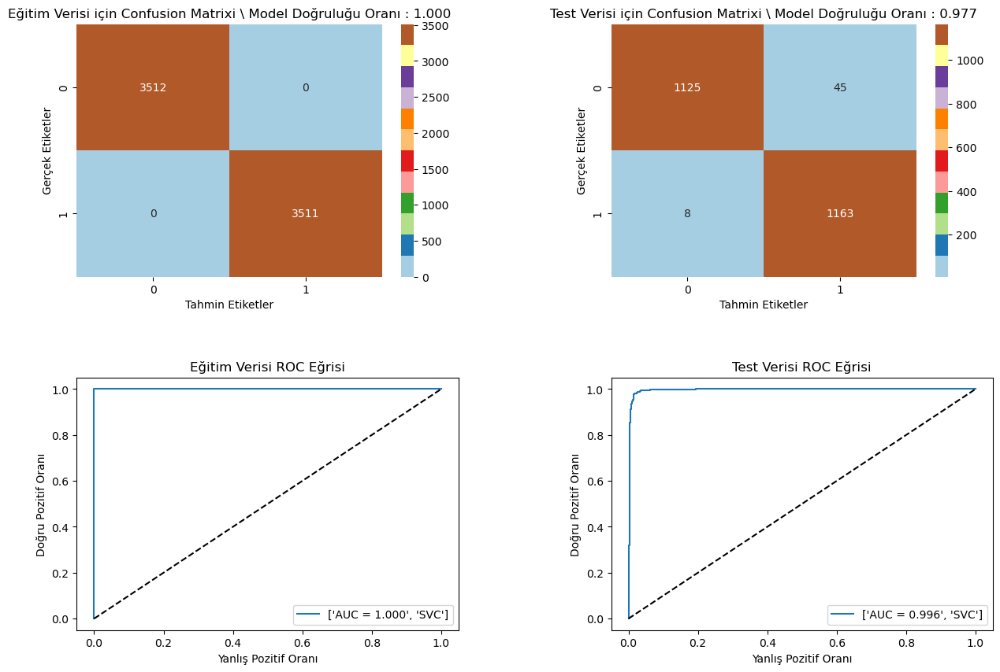

In [339]:
cfm_roc_maker(svm_model)

In [340]:
model_deg(svm_model)    
cros_val(svm_model)
# log-loss lar arasında biraz fark var belki model bazı veri grupları üzerinde model biraz daha fazla belirsizlik durumu yaşıyor olabilir. 
# fakat f1-hassasiyet ve duyarlılık skorlarımız 0.9 un üzerinde ve  
# Eğitim ve test verisi skorları arasında pek fark yok. overfittin sorunu yok gibi görünüyor.
# GridCV hiperparametre analizi çok iyi sonuçlar verdi.Hem eğitim hemde test verisinde modelimizin tahminlerinin doğruluğu arttı.

Model İsmi :  SVC 

Eğitim Verisi için Doğruluk Skoru :  1.0 

Eğitim Verisi için F-1 Skoru :  1.0 
 
Eğitim Verisi için Hassasiyet Skoru :  1.0 

Eğitim Verisi için Duyarlılık Skoru : 1.0 

Eğitim Verisi için Jaccardi Skoru :  1.0 

Eğitim Verisi için Log-Loss Skoru :  2.2204460492503136e-16 

Model İsmi :  SVC

Test Verisi için Doğruluk Skoru :  0.9773601025202905 

Test Verisi için F-1 Skoru :  0.9773601025202905 

Test Verisi için Hassasiyet Skoru :  0.9773601025202905 

Test Verisi için Duyarlılık Skoru :  0.9773601025202905 

Test Verisi için Jaccardi Skoru : 0.9557226399331662 
 
Test Verisi için Log-Loss Skoru : 0.8160246175237974 

 
 Çapraz Doğrulama Skoru : 0.9827012631137031


### Gridden Önce : 

Model İsmi :  SVC 

Eğitim Verisi için F-1 Skoru :  0.9491670226398975 
 
Eğitim Verisi için Hassasiyet Skoru :  0.9491670226398975

Eğitim Verisi için Duyarlılık Skoru : 0.9491670226398975 

Eğitim Verisi için Jaccardi Skoru :  0.9032520325203252

Eğitim Verisi için Log-Loss Skoru :  1.8322062167043747

Model İsmi :  SVC

Test Verisi için F-1 Skoru :  0.9260999572832123

Test Verisi için Hassasiyet Skoru :  0.9260999572832123

Test Verisi için Duyarlılık Skoru :  0.9260999572832123

Test Verisi için Jaccardi Skoru : 0.862370723945903
 
Test Verisi için Log-Loss Skoru : 2.663627525124847


### RANDOM FOREST

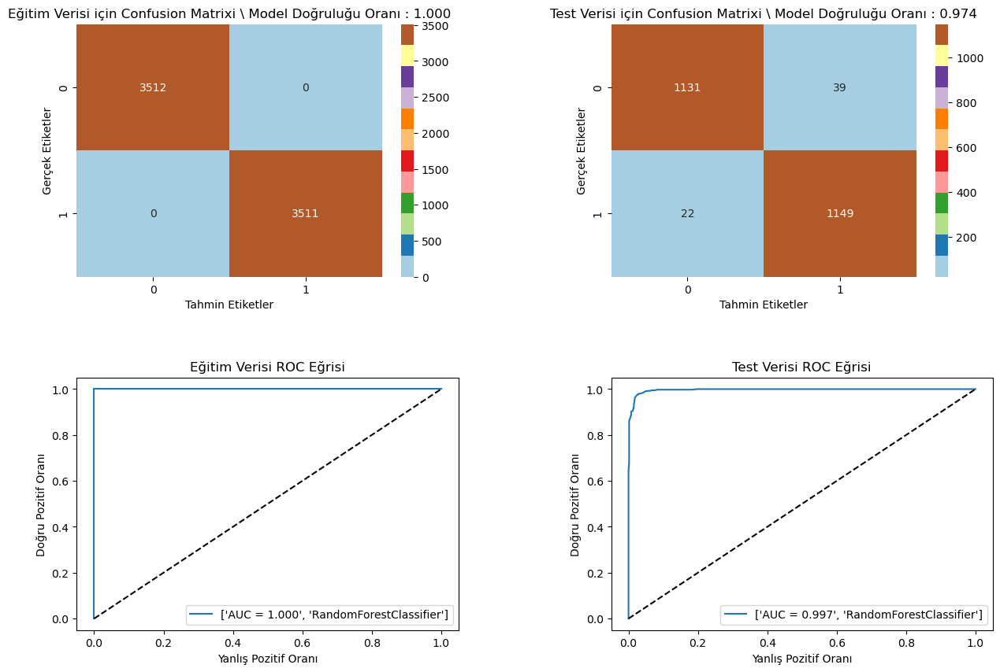

In [341]:
cfm_roc_maker(ran_for_model)

In [342]:
model_deg(ran_for_model) 
cros_val(ran_for_model)

Model İsmi :  RandomForestClassifier 

Eğitim Verisi için Doğruluk Skoru :  1.0 

Eğitim Verisi için F-1 Skoru :  1.0 
 
Eğitim Verisi için Hassasiyet Skoru :  1.0 

Eğitim Verisi için Duyarlılık Skoru : 1.0 

Eğitim Verisi için Jaccardi Skoru :  1.0 

Eğitim Verisi için Log-Loss Skoru :  2.2204460492503136e-16 

Model İsmi :  RandomForestClassifier

Test Verisi için Doğruluk Skoru :  0.9739427595044853 

Test Verisi için F-1 Skoru :  0.9739427595044853 

Test Verisi için Hassasiyet Skoru :  0.9739427595044853 

Test Verisi için Duyarlılık Skoru :  0.9739427595044853 

Test Verisi için Jaccardi Skoru : 0.9492089925062448 
 
Test Verisi için Log-Loss Skoru : 0.9391981446972006 

 
 Çapraz Doğrulama Skoru : 0.9697797878991151


### DECİSİON TREE

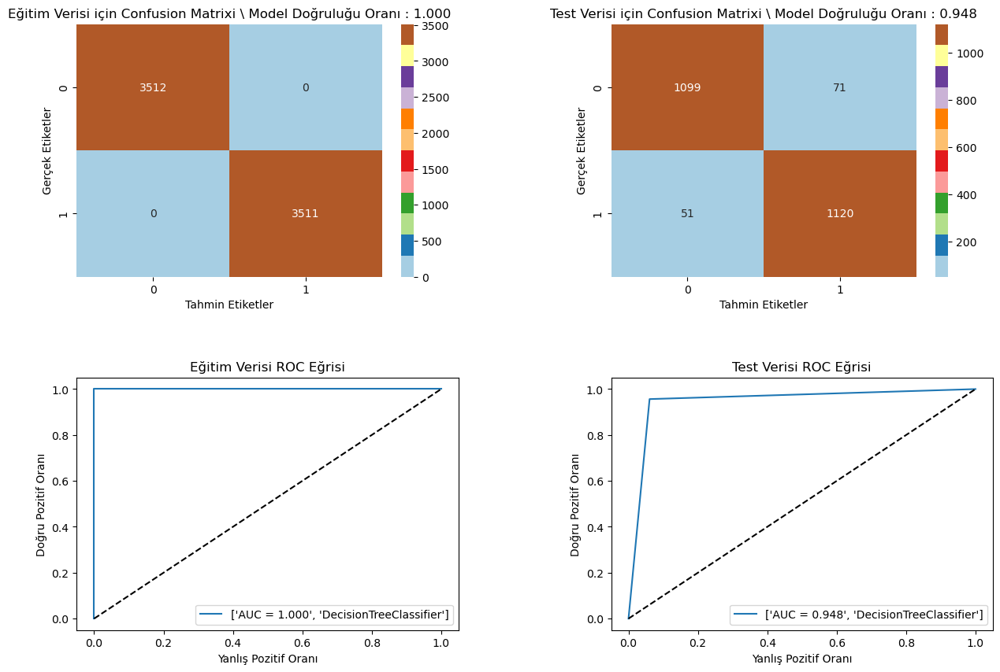

In [343]:
cfm_roc_maker(dec_tree_model)

In [344]:
model_deg(dec_tree_model)
cros_val(dec_tree_model)

Model İsmi :  DecisionTreeClassifier 

Eğitim Verisi için Doğruluk Skoru :  1.0 

Eğitim Verisi için F-1 Skoru :  1.0 
 
Eğitim Verisi için Hassasiyet Skoru :  1.0 

Eğitim Verisi için Duyarlılık Skoru : 1.0 

Eğitim Verisi için Jaccardi Skoru :  1.0 

Eğitim Verisi için Log-Loss Skoru :  2.2204460492503136e-16 

Model İsmi :  DecisionTreeClassifier

Test Verisi için Doğruluk Skoru :  0.9478855190089706 

Test Verisi için F-1 Skoru :  0.9478855190089706 

Test Verisi için Hassasiyet Skoru :  0.9478855190089706 

Test Verisi için Duyarlılık Skoru :  0.9478855190089706 

Test Verisi için Jaccardi Skoru : 0.900933820544052 
 
Test Verisi için Log-Loss Skoru : 1.8783962893944013 

 
 Çapraz Doğrulama Skoru : 0.9261034562222497


### XGBoost

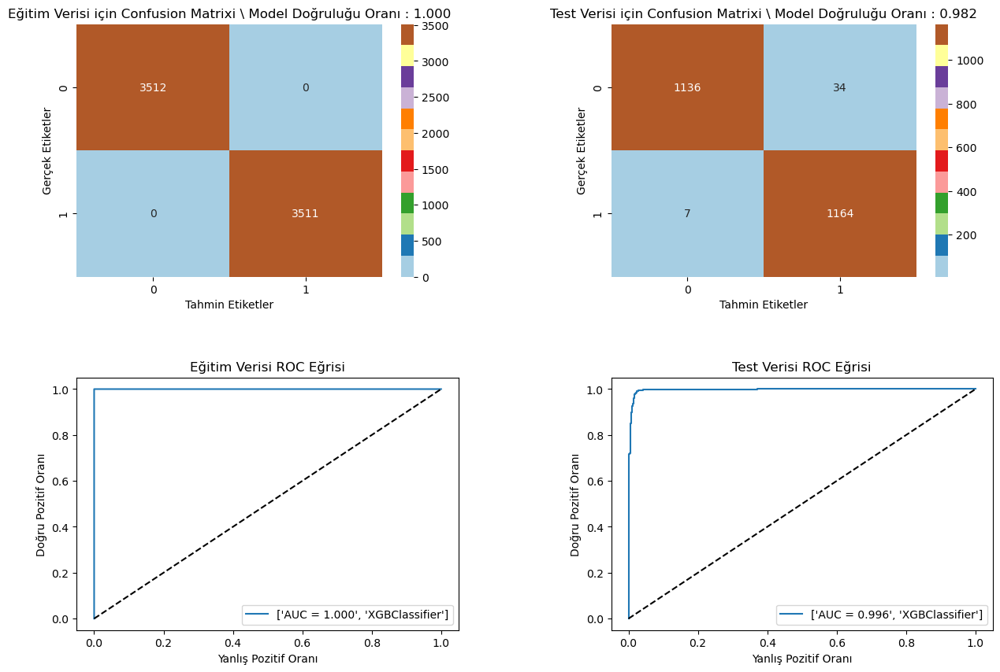

In [345]:
cfm_roc_maker(xgb_model)

In [346]:
model_deg(xgb_model)
cros_val(xgb_model)

Model İsmi :  XGBClassifier 

Eğitim Verisi için Doğruluk Skoru :  1.0 

Eğitim Verisi için F-1 Skoru :  1.0 
 
Eğitim Verisi için Hassasiyet Skoru :  1.0 

Eğitim Verisi için Duyarlılık Skoru : 1.0 

Eğitim Verisi için Jaccardi Skoru :  1.0 

Eğitim Verisi için Log-Loss Skoru :  2.2204460492503136e-16 

Model İsmi :  XGBClassifier

Test Verisi için Doğruluk Skoru :  0.9824861170439982 

Test Verisi için F-1 Skoru :  0.9824861170439982 

Test Verisi için Hassasiyet Skoru :  0.9824861170439982 

Test Verisi için Duyarlılık Skoru :  0.9824861170439982 

Test Verisi için Jaccardi Skoru : 0.9655751469353484 
 
Test Verisi için Log-Loss Skoru : 0.6312643267636924 

 
 Çapraz Doğrulama Skoru : 0.9667907876663883


### Feature İmportance
- Bir özelliğin hedef değişkeni tahmin etmedeki önemi göstermek için kulllanılır.

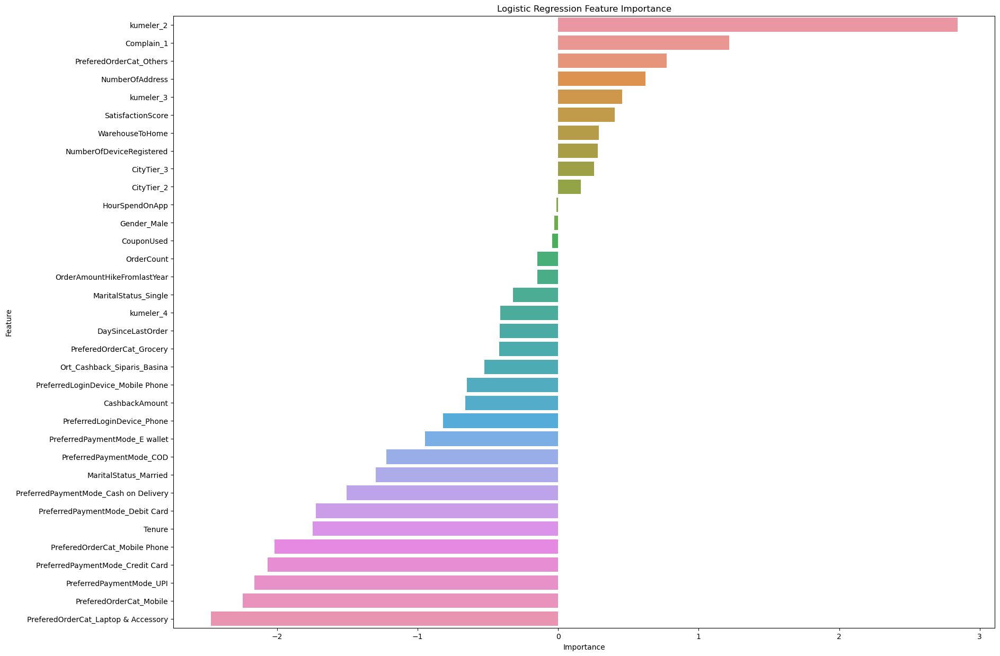

In [347]:
fea_imp = pd.DataFrame({'Feature' : X.columns , 'Importance' : log_reg.coef_[0]})
fea_imp = fea_imp.sort_values('Importance' , ascending=False)
plt.figure(figsize = (20,15))
sns.barplot(x = 'Importance' , y = 'Feature' , data = fea_imp)
plt.title('Logistic Regression Feature Importance')
plt.show()

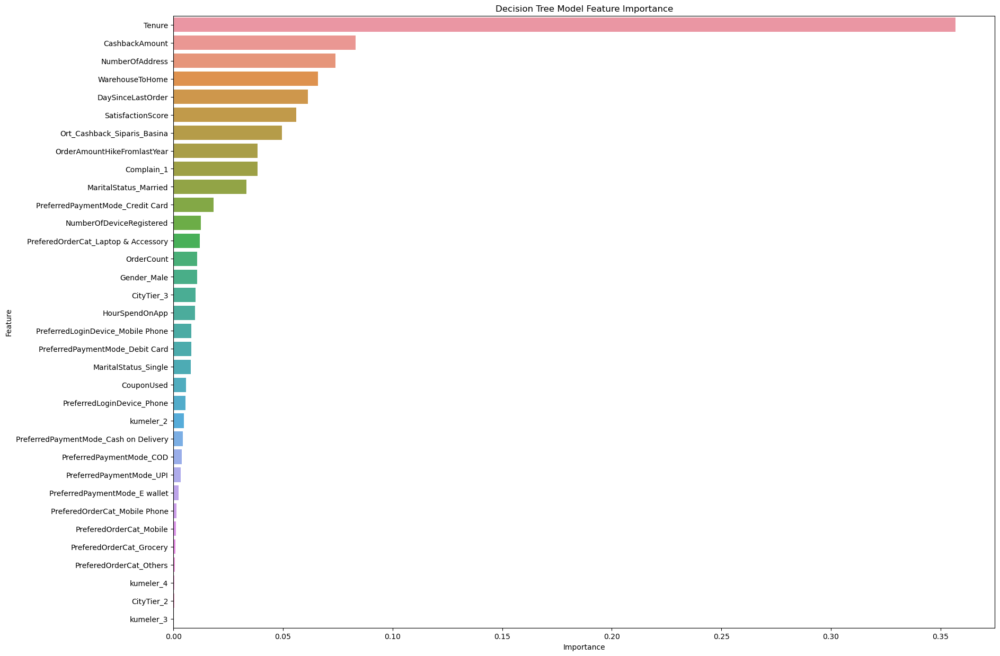

In [348]:
dec_tree_importances = dec_tree_model.feature_importances_
fea_imp = pd.DataFrame({'Feature' : X_train.columns, 'Importance': dec_tree_importances})
fea_imp = fea_imp.sort_values('Importance', ascending = False)
plt.figure(figsize = (20, 15))
sns.barplot(x = 'Importance', y = 'Feature', data = fea_imp)
plt.title("Decision Tree Model Feature Importance")
plt.show()

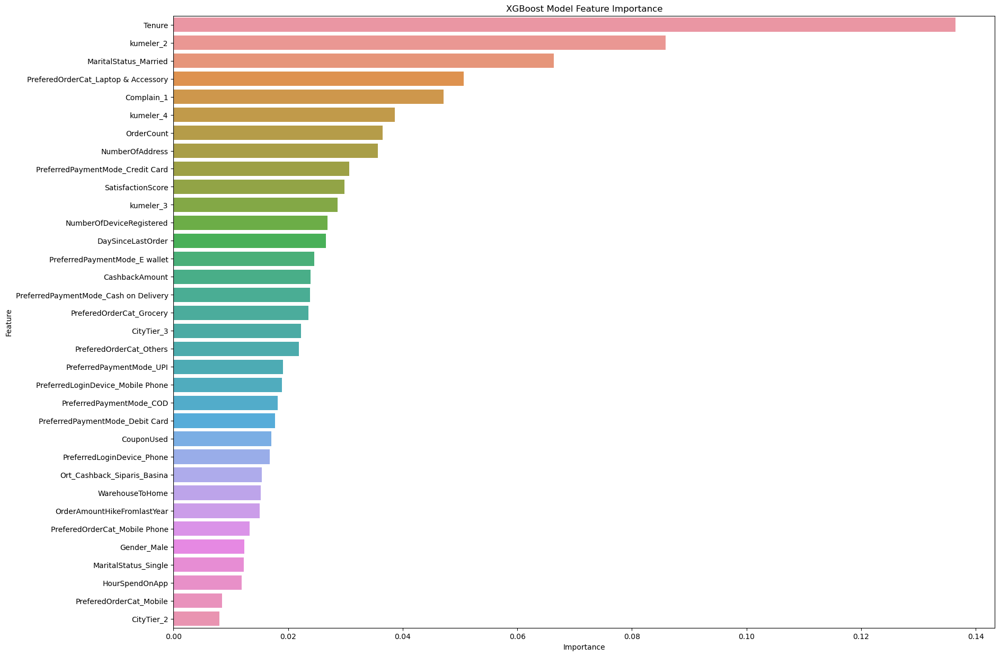

In [349]:
xgb_importances = xgb_model.feature_importances_
fea_imp = pd.DataFrame({'Feature' : X_train.columns, 'Importance': xgb_importances})
fea_imp = fea_imp.sort_values('Importance', ascending = False)
plt.figure(figsize = (20, 15))
sns.barplot(x = 'Importance', y = 'Feature', data = fea_imp)
plt.title("XGBoost Model Feature Importance")
plt.show()

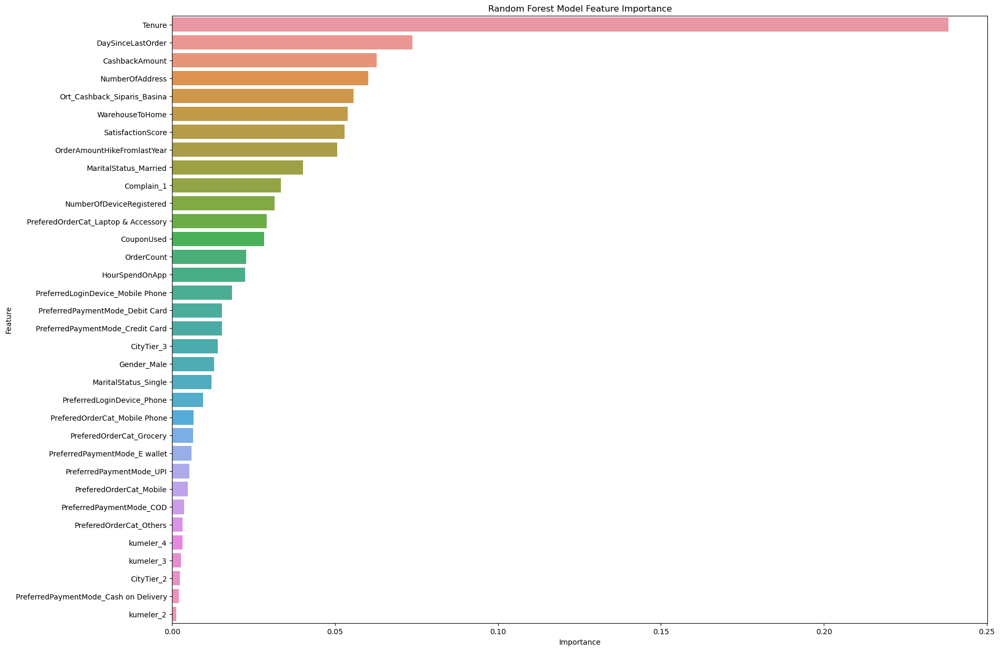

In [350]:
ran_for_importances = ran_for_model.feature_importances_
fea_imp = pd.DataFrame({'Feature' : X_train.columns, 'Importance': ran_for_importances})
fea_imp = fea_imp.sort_values('Importance', ascending = False)
plt.figure(figsize = (20, 15))
sns.barplot(x = 'Importance', y = 'Feature', data = fea_imp)
plt.title("Random Forest Model Feature Importance")
plt.show()

In [ ]:
# Kurduğumuz modellerden için sonuçlar için başarılı diyebiliriz.Overfitting sorunu gözükmüyor.Cross val uyguladık ve sonuçların doğruluk skoru yakın olduğunu gördük.
# Test verisi ve eğitim verisi skorları arwasında uçurum farklar yok.
# Yinede modellerin skorları gerçek durumlara göre yüksek kalıyor. .Belki daha doğru sonuçlar için daha fazla veriye ihtiyacımız olabilir.
# Bazı özelliklerimizin gereksiz olduğunu görebiliyoruz.Özellik azaltma yapılabilir.Modellerin karmaşıklığı azaltılabilir.
# Farklı düzenlileştime yöntemleri kullanılabilir.
# shap analizi ile modellerimizin nasıl çalıştığını , tahminlerin sebeplerini anlayabiliriz. Belli özelliklerin etkileri inceleyebilir modelleri optimize edebiliriz.